In [1]:
import pandas as pd
import numpy as np
import os
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from matplotlib.backends.backend_pdf import PdfPages
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsRegressor
from sklearn.metrics import accuracy_score
import warnings
from joblib import dump

# hide ipykernel warnings
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

C:\Users\Yanwen\AppData\Local\Temp\ipykernel_20068\3195997552.py:1: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


In [2]:
# read in data from csv file to pandas dataframe
df_station = pd.read_csv('stationdata.csv', keep_default_na=True, delimiter=',', skipinitialspace=True)
df_weather = pd.read_csv('weatherdata.csv', keep_default_na=True, delimiter=',', skipinitialspace=True)

#### Station table

In [3]:
df_station.shape

(836760, 7)

In [4]:
df_station.head(5)

,id,number,available_bikes,available_bike_stands,status,last_update,recorded_at
0,27361,42,5,25,NaN,1709212104000,2024-02-29 13:10:59
1,27362,30,11,9,NaN,1709212182000,2024-02-29 13:10:59
2,27363,54,15,18,NaN,1709211940000,2024-02-29 13:10:59
3,27364,108,17,18,NaN,1709211839000,2024-02-29 13:10:59
4,27365,20,21,9,NaN,1709211935000,2024-02-29 13:10:59


In [5]:
constant_columns_station = [col for col in df_station.columns if df_station[col].nunique() == 1]

print("Constant features: ", constant_columns_station)

Constant features:  ['status']


In [6]:
df_station.drop(columns=['status'], inplace=True)

In [7]:
# Deal with time features
df_station['last_update'] = pd.to_datetime(df_station['last_update'], unit='ms')
df_station.drop(columns=['recorded_at'], inplace=True)
df_station.head(5)

,id,number,available_bikes,available_bike_stands,last_update
0,27361,42,5,25,2024-02-29 13:08:24
1,27362,30,11,9,2024-02-29 13:09:42
2,27363,54,15,18,2024-02-29 13:05:40
3,27364,108,17,18,2024-02-29 13:03:59
4,27365,20,21,9,2024-02-29 13:05:35


#### Weather table

In [8]:
df_weather.shape

(7844, 20)

In [9]:
df_weather.head(5)

,id,location_id,longitude,latitude,weather_id,weather_main,weather_description,weather_icon,temp,feels_like,temp_min,temp_max,pressure,humidity,visibility,wind_speed,wind_deg,clouds,data_timestamp,recorded_at
0,689,2964574,-6.2672,53.344,802,Clouds,scattered clouds,03n,6.13,2.92,5.53,6.60,1018,77,10000,4.63,220,40,1709077971,2024-02-27 23:54:38
1,690,2964574,-6.2672,53.344,802,Clouds,scattered clouds,03n,6.13,2.92,5.53,6.60,1018,77,10000,4.63,220,40,1709077971,2024-02-27 23:59:38
2,691,2964574,-6.2672,53.344,802,Clouds,scattered clouds,03n,6.13,2.92,5.53,6.60,1018,77,10000,4.63,220,40,1709077971,2024-02-28 00:04:38
3,692,2964574,-6.2672,53.344,802,Clouds,scattered clouds,03n,6.00,3.64,5.74,6.36,1018,77,10000,3.09,250,40,1709078753,2024-02-28 00:09:38
4,693,2964574,-6.2672,53.344,802,Clouds,scattered clouds,03n,6.00,3.64,5.74,6.36,1018,77,10000,3.09,250,40,1709079249,2024-02-28 00:14:39


In [10]:
constant_columns_weather = [col for col in df_weather.columns if df_weather[col].nunique() == 1]

print("Constant features: ", constant_columns_weather)

Constant features:  ['location_id', 'longitude', 'latitude']


In [11]:
# Delete constant features
df_weather.drop(columns=['location_id', 'longitude', 'latitude'], inplace=True)

In [12]:
# Delete useless features
columns_to_drop = ['visibility', 'wind_deg' , 'recorded_at',
                   'weather_description', 'weather_icon']
df_weather.drop(columns=columns_to_drop, axis=1, inplace=True)

In [13]:
# Deal with time features
df_weather['data_timestamp'] = pd.to_datetime(df_weather['data_timestamp'], unit='s')
df_weather.head(5)

,id,weather_id,weather_main,temp,feels_like,temp_min,temp_max,pressure,humidity,wind_speed,clouds,data_timestamp
0,689,802,Clouds,6.13,2.92,5.53,6.60,1018,77,4.63,40,2024-02-27 23:52:51
1,690,802,Clouds,6.13,2.92,5.53,6.60,1018,77,4.63,40,2024-02-27 23:52:51
2,691,802,Clouds,6.13,2.92,5.53,6.60,1018,77,4.63,40,2024-02-27 23:52:51
3,692,802,Clouds,6.00,3.64,5.74,6.36,1018,77,3.09,40,2024-02-28 00:05:53
4,693,802,Clouds,6.00,3.64,5.74,6.36,1018,77,3.09,40,2024-02-28 00:14:09


#### Merge two table

In [14]:
df_station.sort_values('last_update', inplace=True)
df_weather.sort_values('data_timestamp', inplace=True)

df_merged = pd.merge_asof(df_station, df_weather, left_on='last_update', right_on='data_timestamp', direction='nearest')
df_merged.head(5)


,id_x,number,available_bikes,available_bike_stands,last_update,id_y,weather_id,weather_main,temp,feels_like,temp_min,temp_max,pressure,humidity,wind_speed,clouds,data_timestamp
0,27423,96,12,18,2024-02-29 13:00:42,1135,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,2024-02-29 13:05:17
1,27430,51,8,32,2024-02-29 13:00:53,1135,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,2024-02-29 13:05:17
2,27402,61,7,18,2024-02-29 13:00:57,1135,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,2024-02-29 13:05:17
3,27425,76,1,37,2024-02-29 13:01:04,1135,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,2024-02-29 13:05:17
4,27386,11,14,16,2024-02-29 13:01:12,1135,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,2024-02-29 13:05:17


In [15]:
df_merged.drop(columns=['id_x', 'id_y', 'data_timestamp'], inplace=True)

In [16]:
df_merged.dtypes

number                            int64
available_bikes                   int64
available_bike_stands             int64
last_update              datetime64[ns]
weather_id                        int64
weather_main                     object
temp                            float64
feels_like                      float64
temp_min                        float64
temp_max                        float64
pressure                          int64
humidity                          int64
wind_speed                      float64
clouds                            int64
dtype: object

In [17]:
df_merged.rename(columns={'number': 'station_id'}, inplace=True)
# Add features 
df_merged['total_bike_stands'] = df_merged['available_bikes'] + df_merged['available_bike_stands']
df_merged['hour'] = df_merged['last_update'].dt.hour
df_merged['day_of_week'] = df_merged['last_update'].dt.dayofweek + 1

df_merged.head(5)


,station_id,available_bikes,available_bike_stands,last_update,weather_id,weather_main,temp,feels_like,temp_min,temp_max,pressure,humidity,wind_speed,clouds,total_bike_stands,hour,day_of_week
0,96,12,18,2024-02-29 13:00:42,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,30,13,4
1,51,8,32,2024-02-29 13:00:53,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,40,13,4
2,61,7,18,2024-02-29 13:00:57,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,25,13,4
3,76,1,37,2024-02-29 13:01:04,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,38,13,4
4,11,14,16,2024-02-29 13:01:12,802,Clouds,8.85,4.98,8.27,9.37,1000,68,8.75,40,30,13,4


In [18]:
df_merged.drop(columns=['available_bike_stands', 'last_update', 'weather_main'], inplace=True)
df_merged.head(5)

,station_id,available_bikes,weather_id,temp,feels_like,temp_min,temp_max,pressure,humidity,wind_speed,clouds,total_bike_stands,hour,day_of_week
0,96,12,802,8.85,4.98,8.27,9.37,1000,68,8.75,40,30,13,4
1,51,8,802,8.85,4.98,8.27,9.37,1000,68,8.75,40,40,13,4
2,61,7,802,8.85,4.98,8.27,9.37,1000,68,8.75,40,25,13,4
3,76,1,802,8.85,4.98,8.27,9.37,1000,68,8.75,40,38,13,4
4,11,14,802,8.85,4.98,8.27,9.37,1000,68,8.75,40,30,13,4


In [19]:
# Type change

df_merged['station_id'] = df_merged['station_id'].astype('category')
df_merged['weather_id'] = df_merged['weather_id'].astype('category')
df_merged['day_of_week'] = df_merged['day_of_week'].astype('category')
df_merged['hour'] = df_merged['hour'].astype('category')
df_merged.dtypes

station_id           category
available_bikes         int64
weather_id           category
temp                  float64
feels_like            float64
temp_min              float64
temp_max              float64
pressure                int64
humidity                int64
wind_speed            float64
clouds                  int64
total_bike_stands       int64
hour                 category
day_of_week          category
dtype: object

In [20]:
df_merged.shape

(836760, 14)

In [21]:
has_null = df_merged.isnull().any().any()

if has_null:
    print("Have Null values in dataset")
else:
    print("No Null value in dataset")

No Null value in dataset


In [22]:
df_merged.to_csv('cleaned_data.csv', index=False)

## Machine Learning

In [23]:
stations = df_merged["station_id"].unique()

models = {}
if not os.path.exists("ML_models"):
    os.makedirs("ML_models")

print(stations)

[96, 51, 61, 76, 11, ..., 48, 66, 102, 3, 14]
Length: 114
Categories (114, int64): [1, 2, 3, 4, ..., 114, 115, 116, 117]


Number of predictions for station 96: 2202
Accuracy: 0.05903723887375113


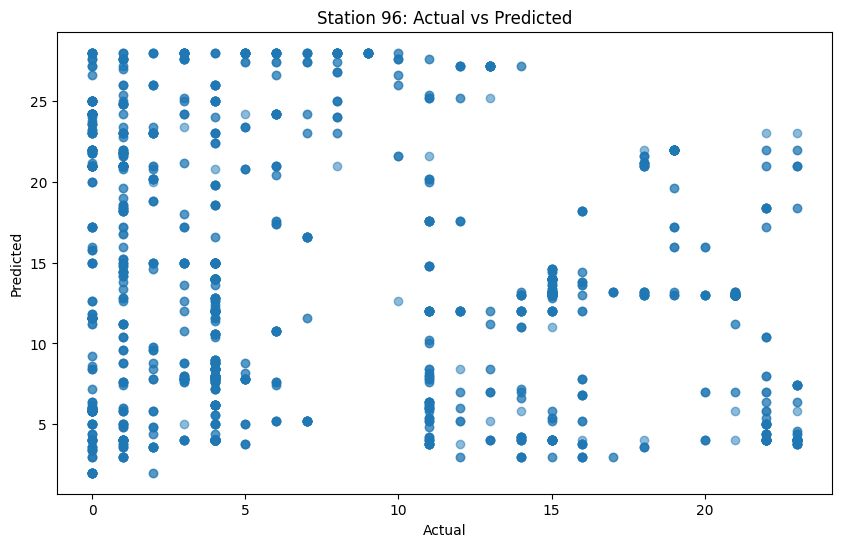

--------------------------------------------------
Number of predictions for station 51: 2202
Accuracy: 0.04178019981834696


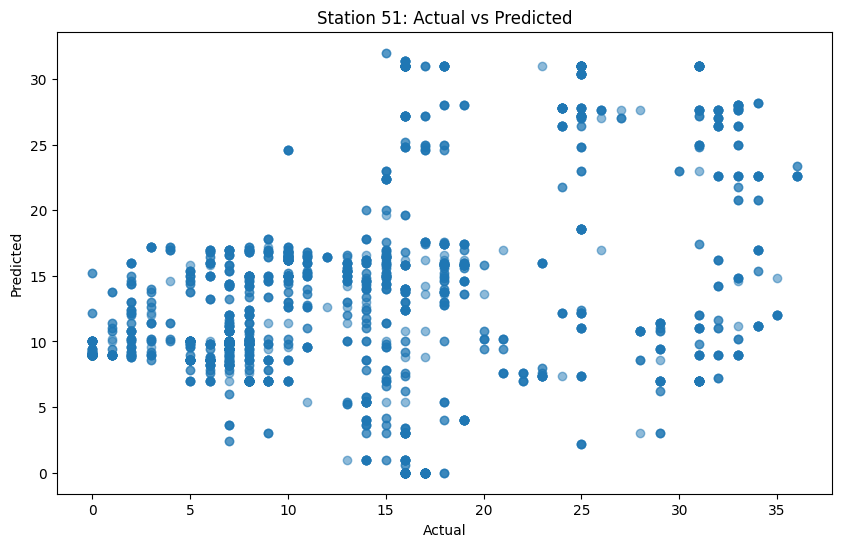

--------------------------------------------------
Number of predictions for station 61: 2202
Accuracy: 0.18664850136239783


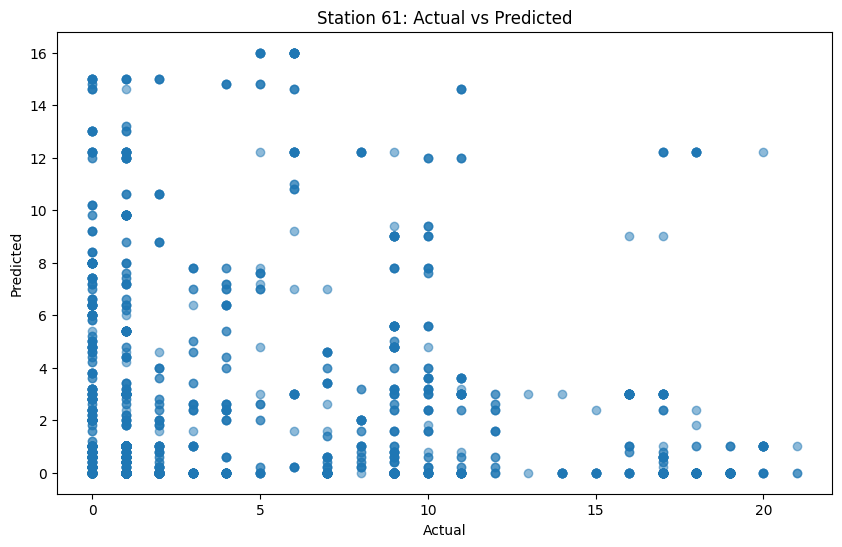

--------------------------------------------------
Number of predictions for station 76: 2202
Accuracy: 0.05404178019981835


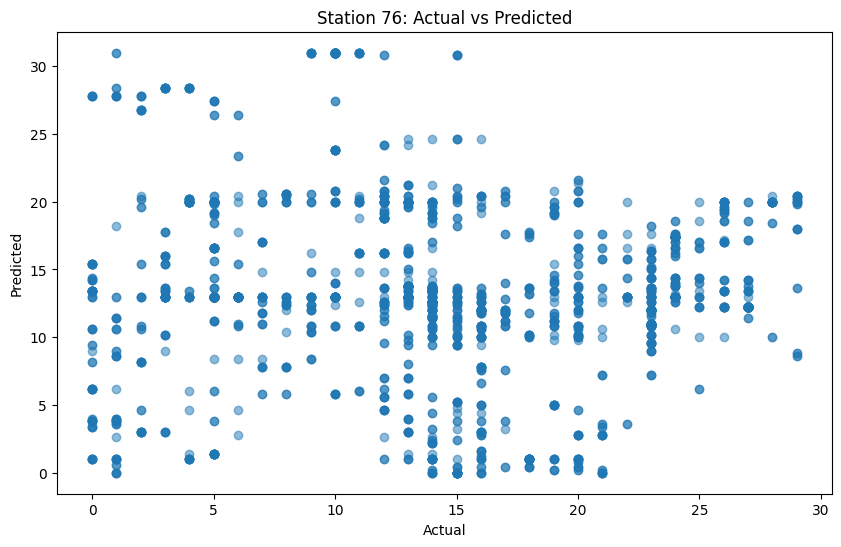

--------------------------------------------------
Number of predictions for station 11: 2202
Accuracy: 0.14486830154405086


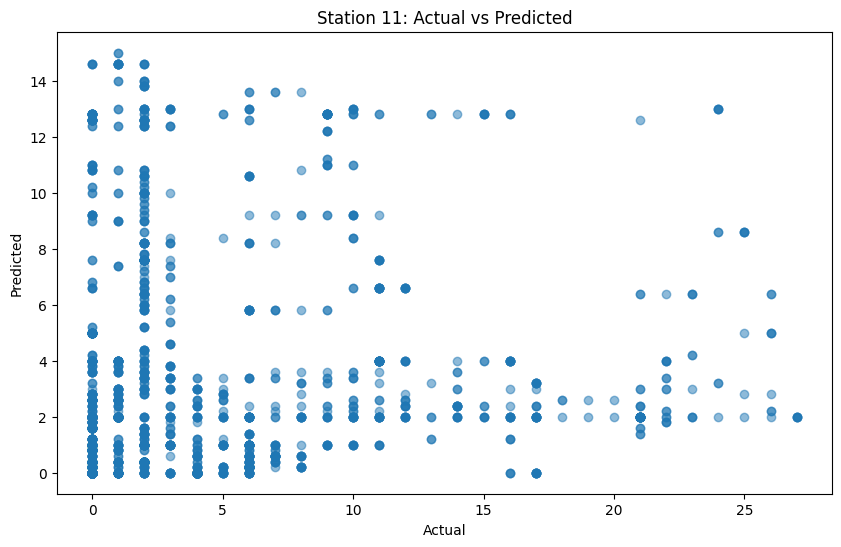

--------------------------------------------------
Number of predictions for station 41: 2202
Accuracy: 0.16348773841961853


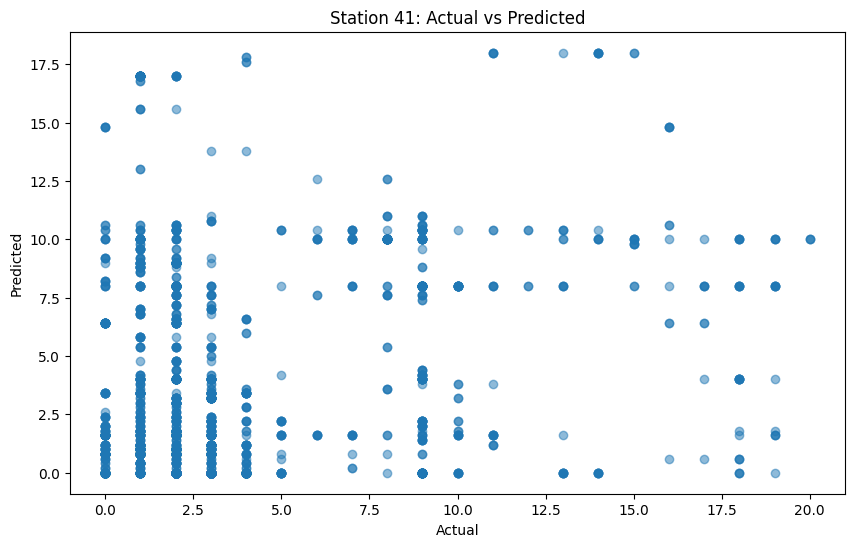

--------------------------------------------------
Number of predictions for station 111: 2202
Accuracy: 0.13760217983651227


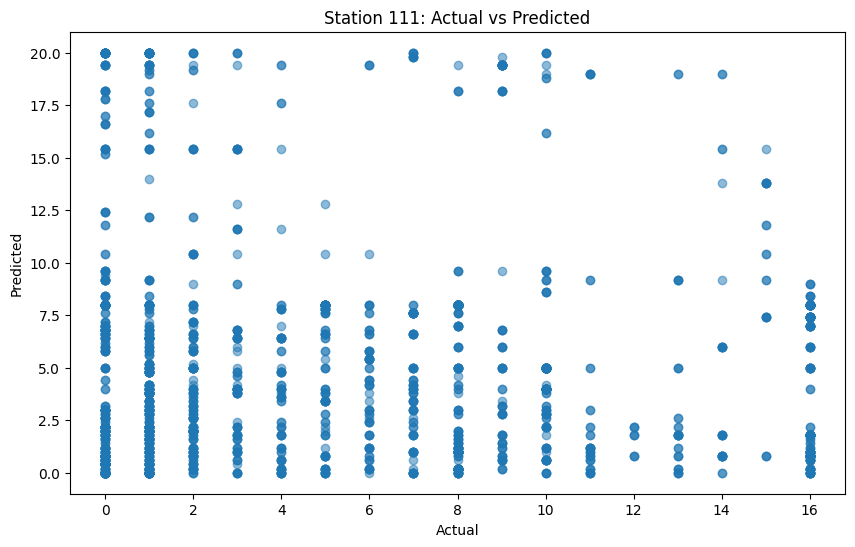

--------------------------------------------------
Number of predictions for station 101: 2202
Accuracy: 0.055858310626702996


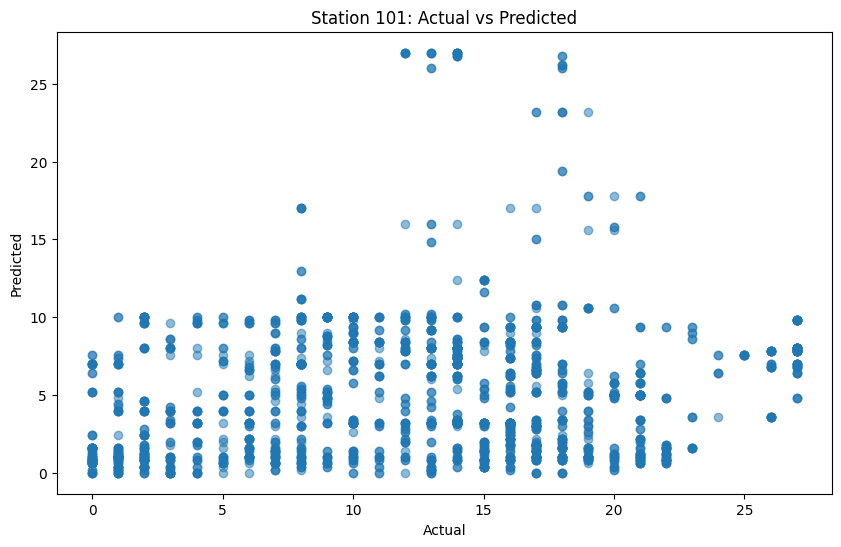

--------------------------------------------------
Number of predictions for station 47: 2202
Accuracy: 0.15712988192552224


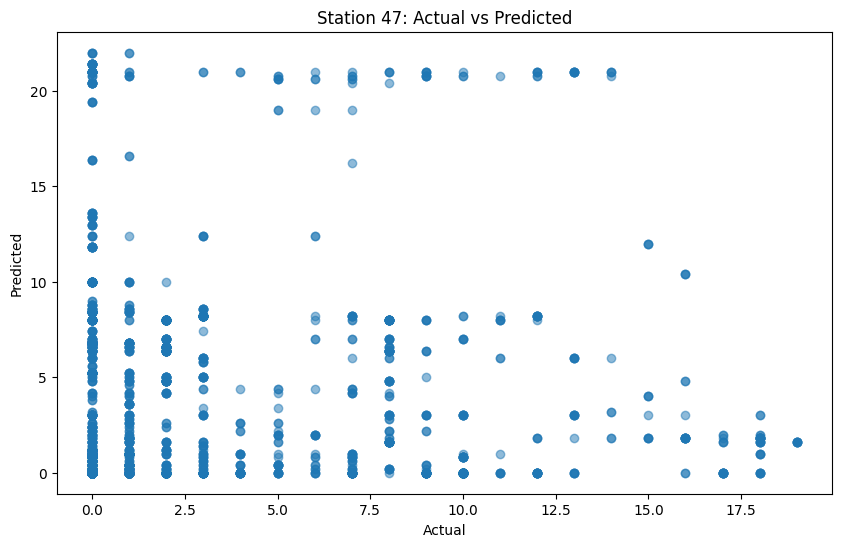

--------------------------------------------------
Number of predictions for station 117: 2202
Accuracy: 0.09491371480472298


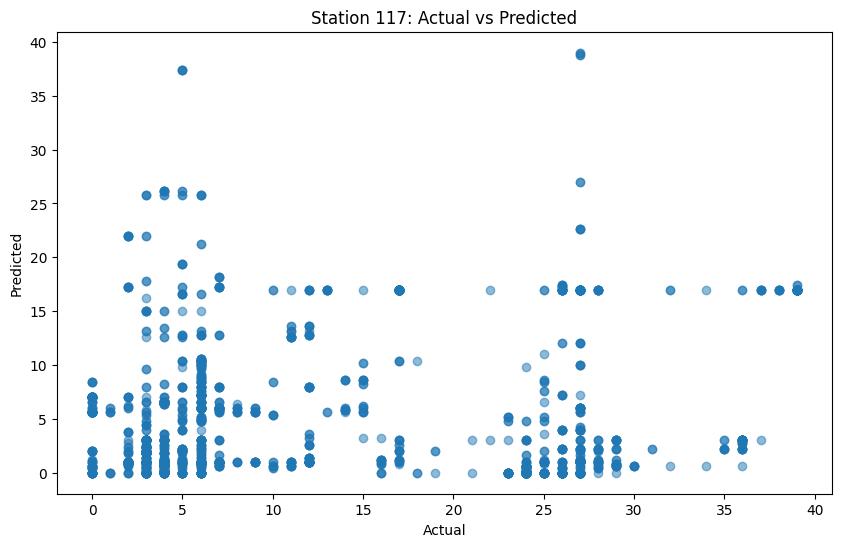

--------------------------------------------------
Number of predictions for station 36: 2202
Accuracy: 0.041326067211625794


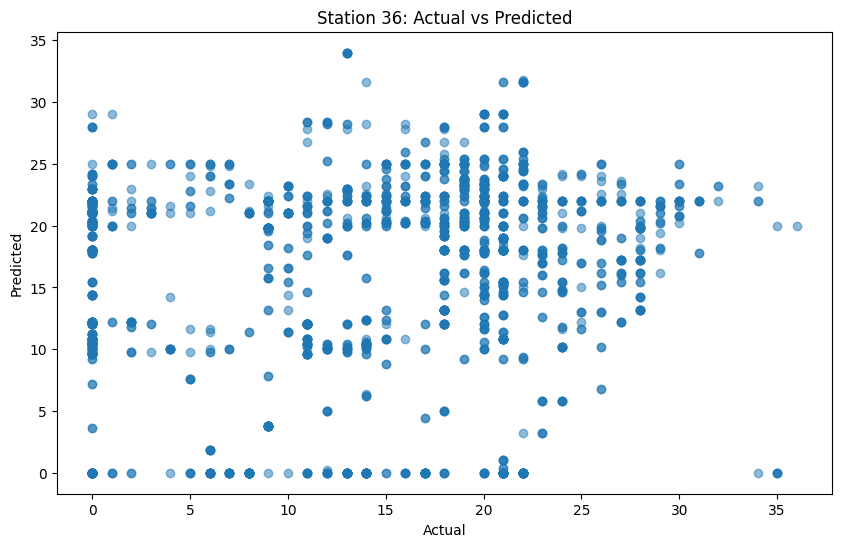

--------------------------------------------------
Number of predictions for station 57: 2202
Accuracy: 0.05086285195277021


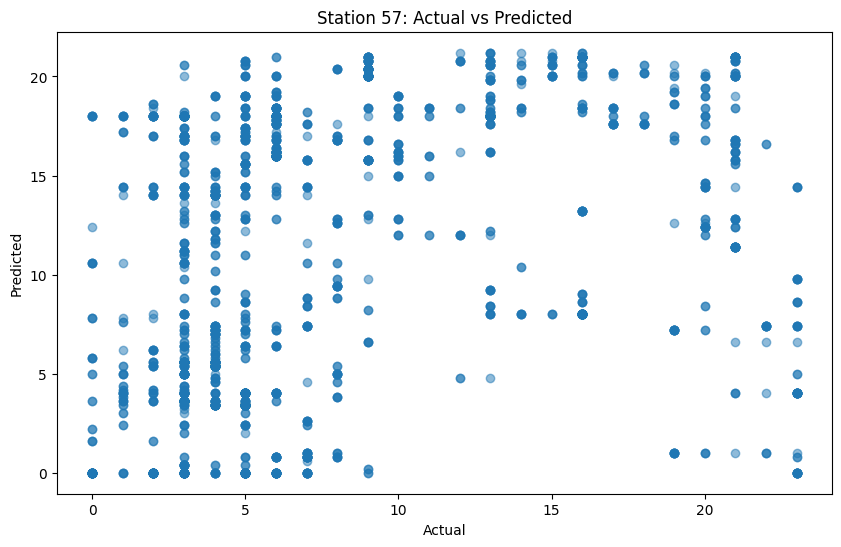

--------------------------------------------------
Number of predictions for station 86: 2202
Accuracy: 0.039509536784741145


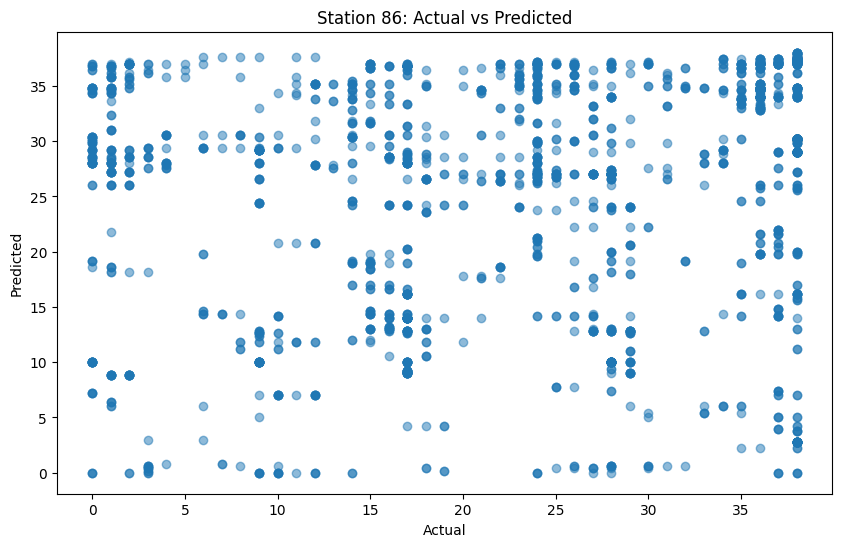

--------------------------------------------------
Number of predictions for station 97: 2202
Accuracy: 0.04495912806539509


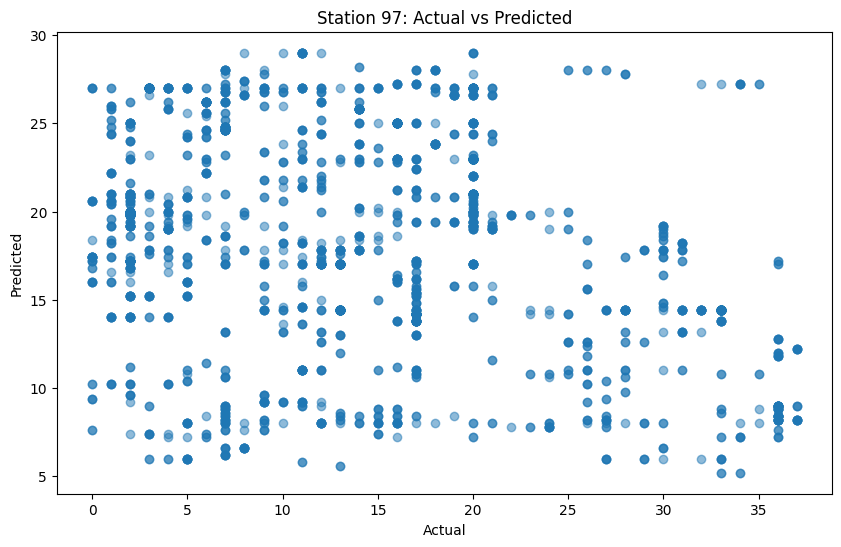

--------------------------------------------------
Number of predictions for station 107: 2202
Accuracy: 0.02861035422343324


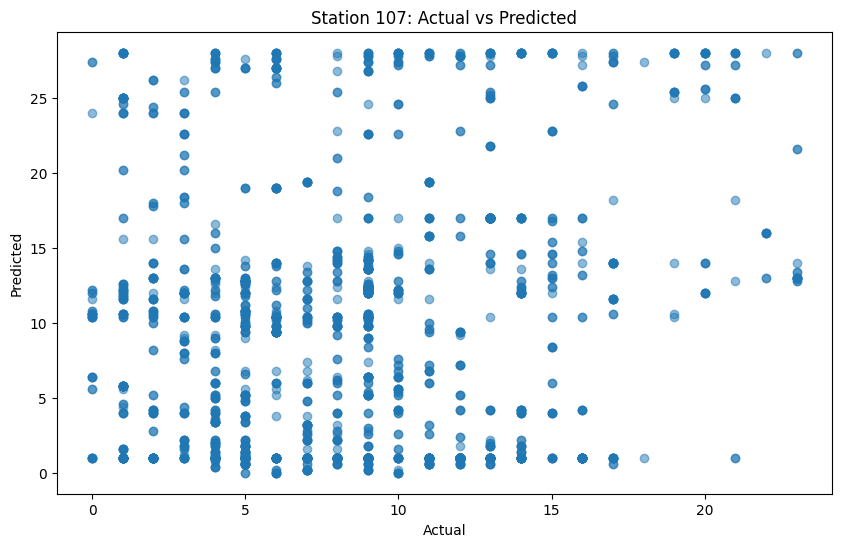

--------------------------------------------------
Number of predictions for station 7: 2202
Accuracy: 0.05131698455949137


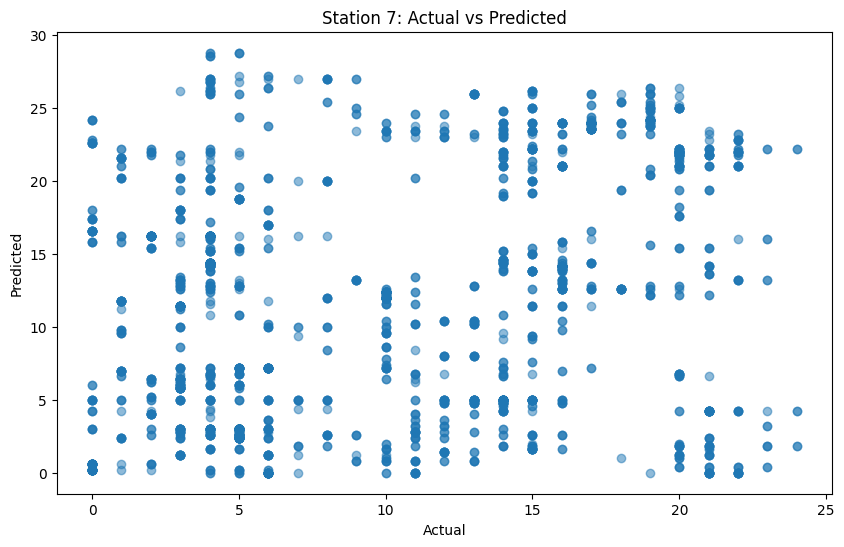

--------------------------------------------------
Number of predictions for station 13: 2202
Accuracy: 0.1344232515894641


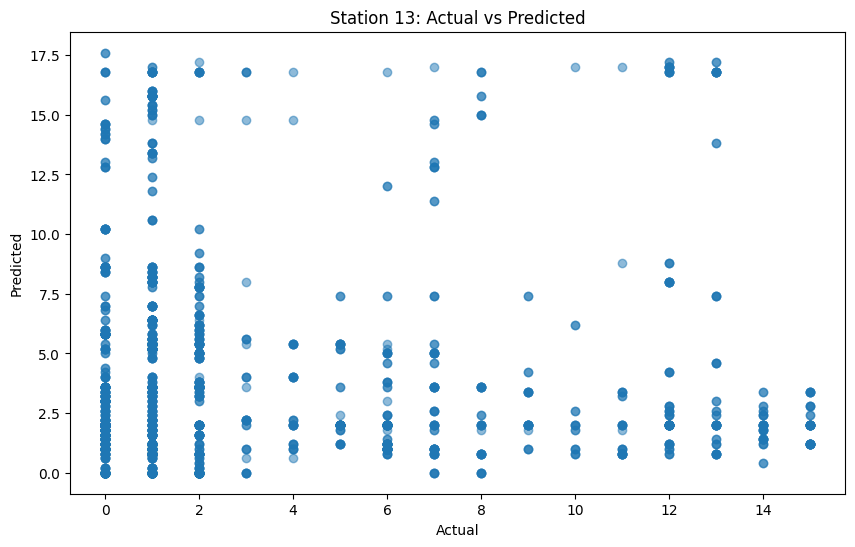

--------------------------------------------------
Number of predictions for station 37: 2202
Accuracy: 0.11080835603996367


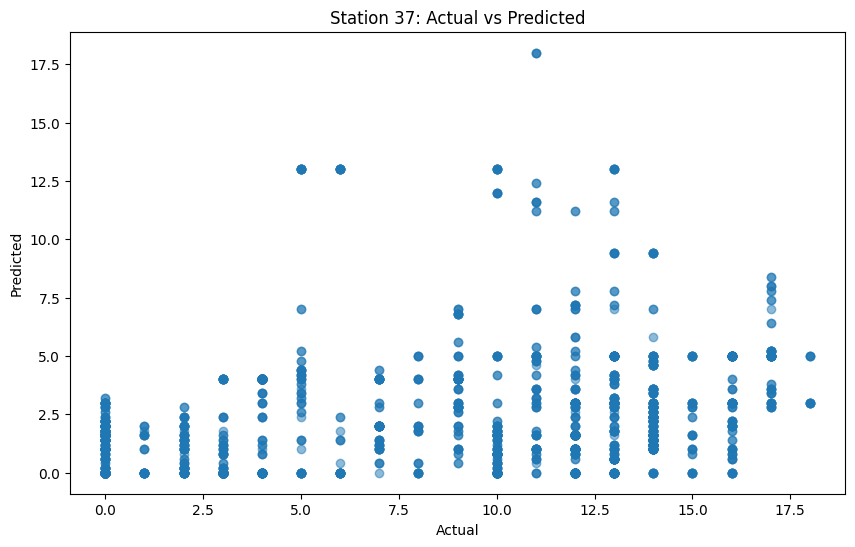

--------------------------------------------------
Number of predictions for station 106: 2202
Accuracy: 0.03905540417801998


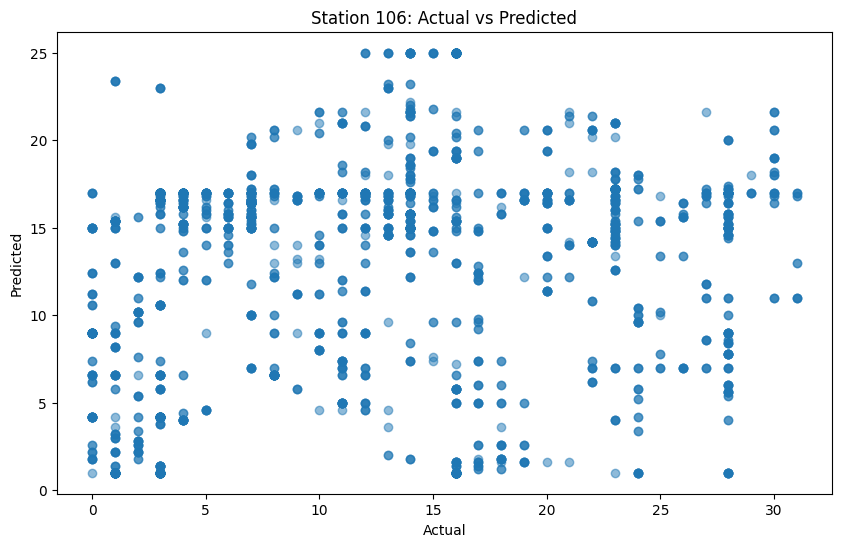

--------------------------------------------------
Number of predictions for station 53: 2202
Accuracy: 0.21889191643960038


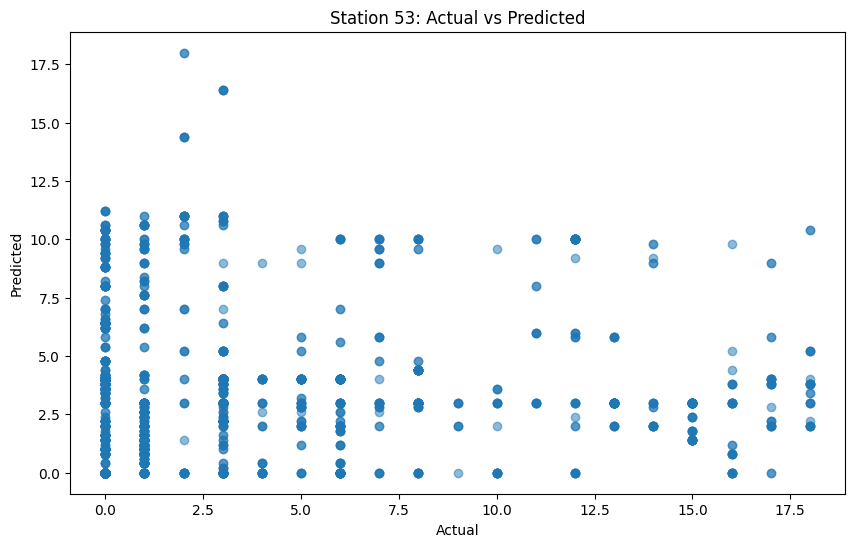

--------------------------------------------------
Number of predictions for station 93: 2202
Accuracy: 0.11898274296094459


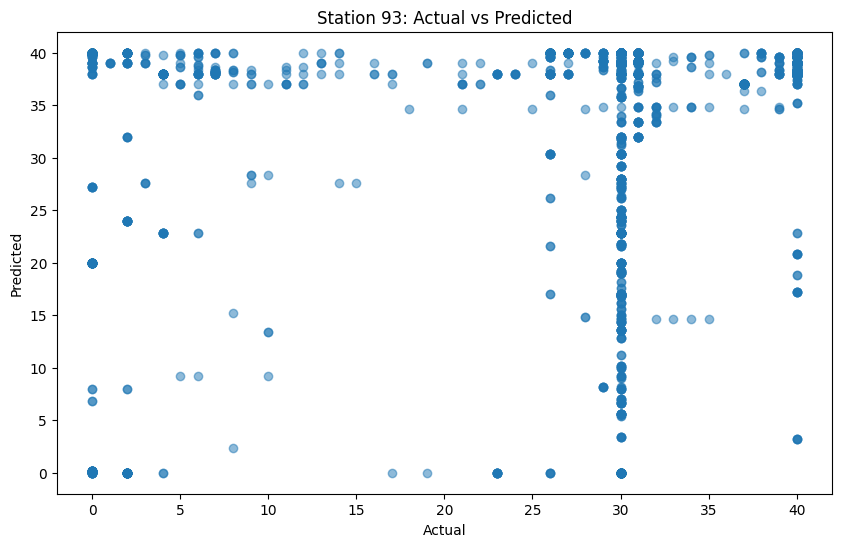

--------------------------------------------------
Number of predictions for station 112: 2202
Accuracy: 0.04632152588555858


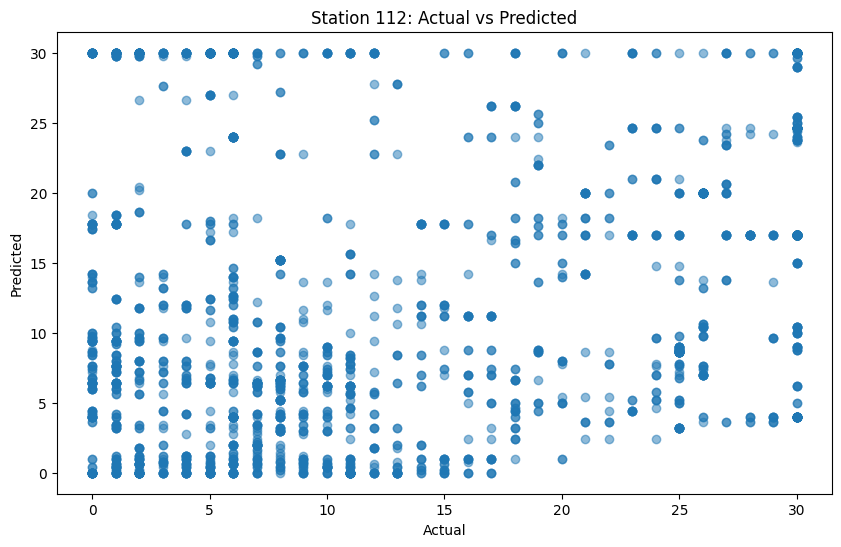

--------------------------------------------------
Number of predictions for station 63: 2202
Accuracy: 0.05994550408719346


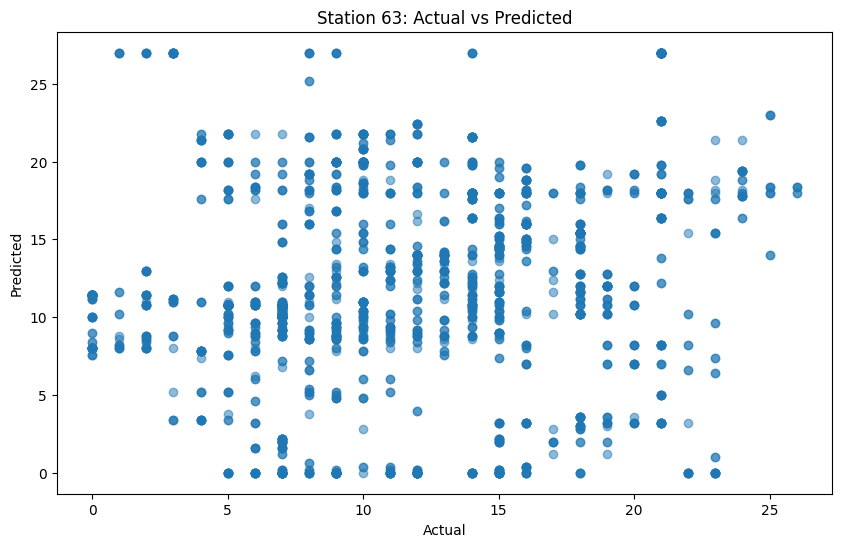

--------------------------------------------------
Number of predictions for station 16: 2202
Accuracy: 0.05313351498637602


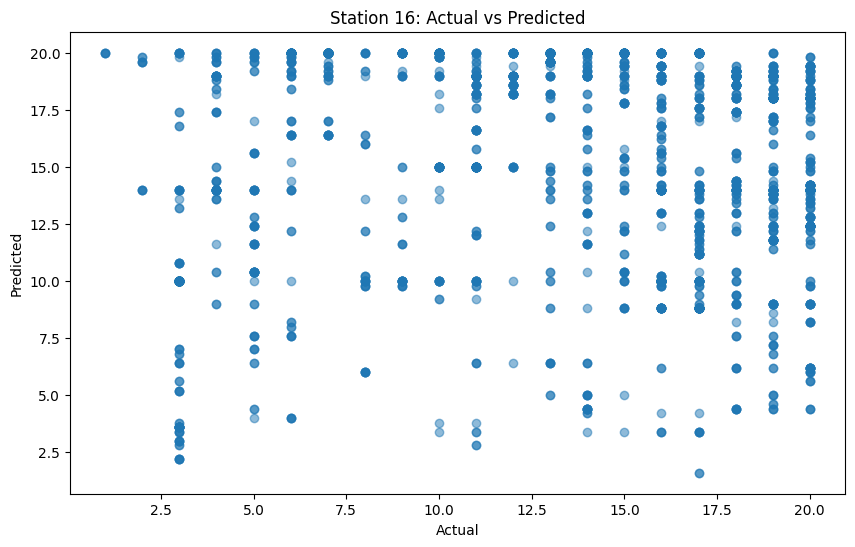

--------------------------------------------------
Number of predictions for station 56: 2202
Accuracy: 0.04405086285195277


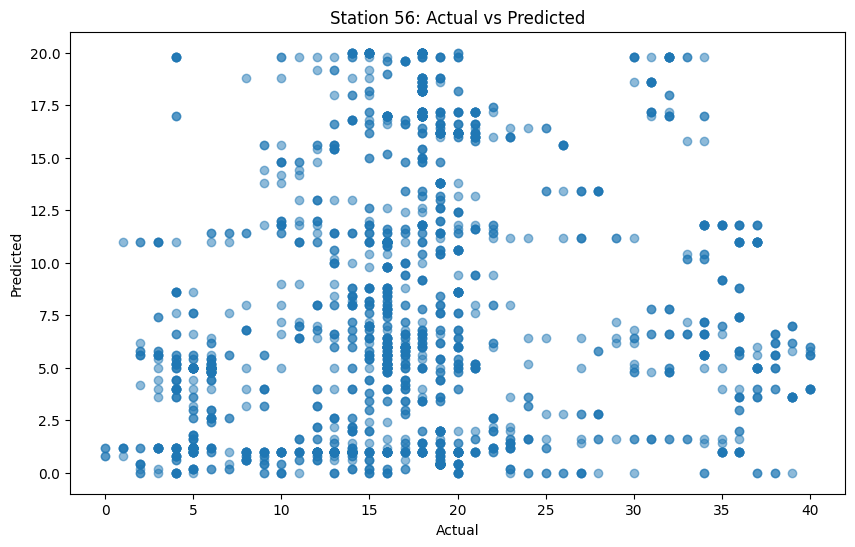

--------------------------------------------------
Number of predictions for station 103: 2202
Accuracy: 0.1553133514986376


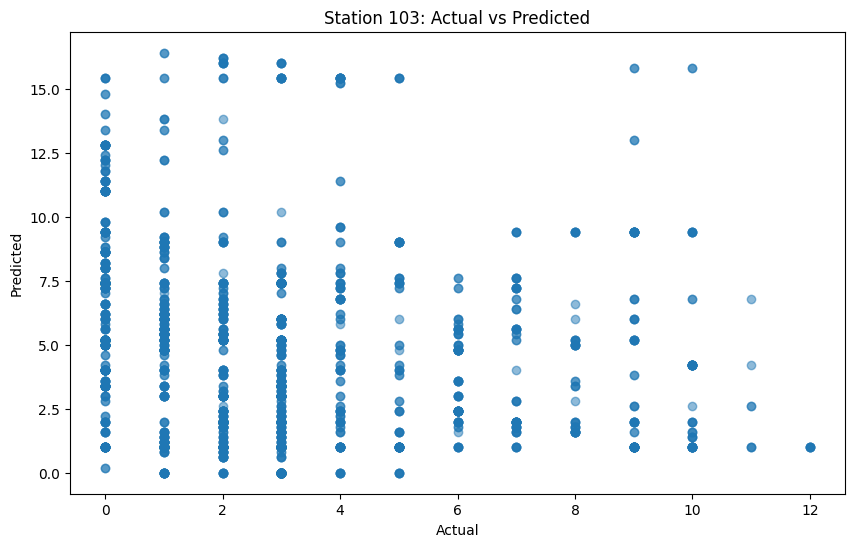

--------------------------------------------------
Number of predictions for station 78: 2202
Accuracy: 0.049500454132606724


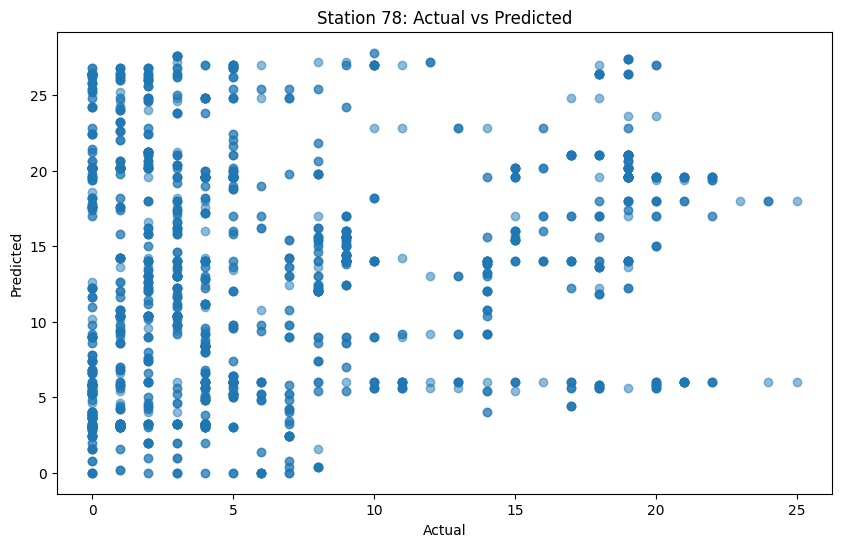

--------------------------------------------------
Number of predictions for station 87: 2202
Accuracy: 0.018619436875567667


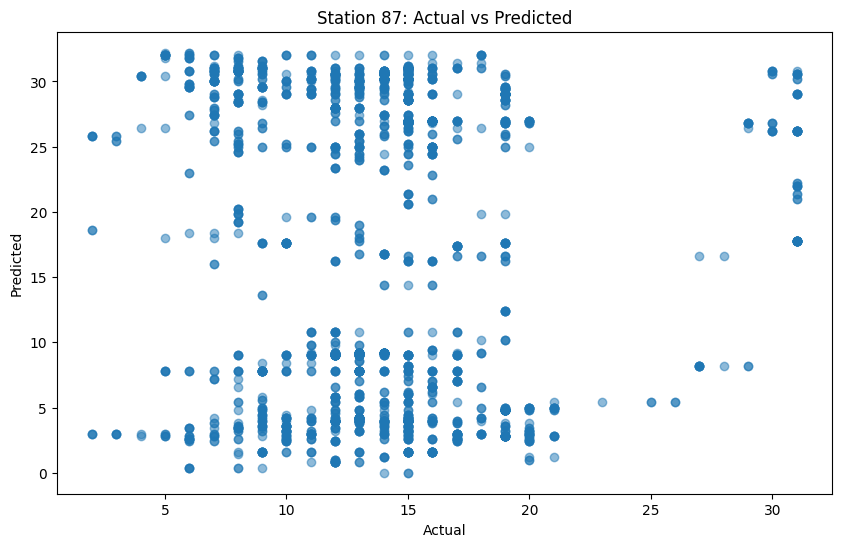

--------------------------------------------------
Number of predictions for station 113: 2202
Accuracy: 0.07175295186194369


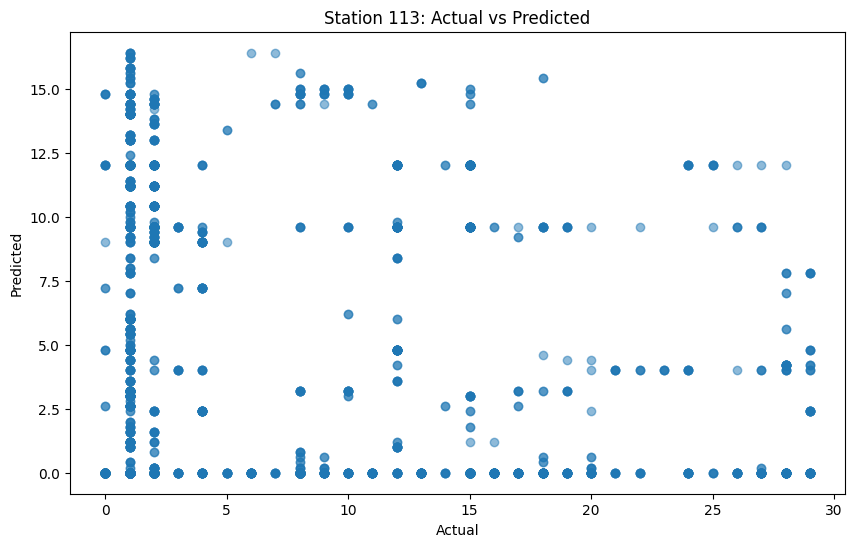

--------------------------------------------------
Number of predictions for station 79: 2202
Accuracy: 0.1907356948228883


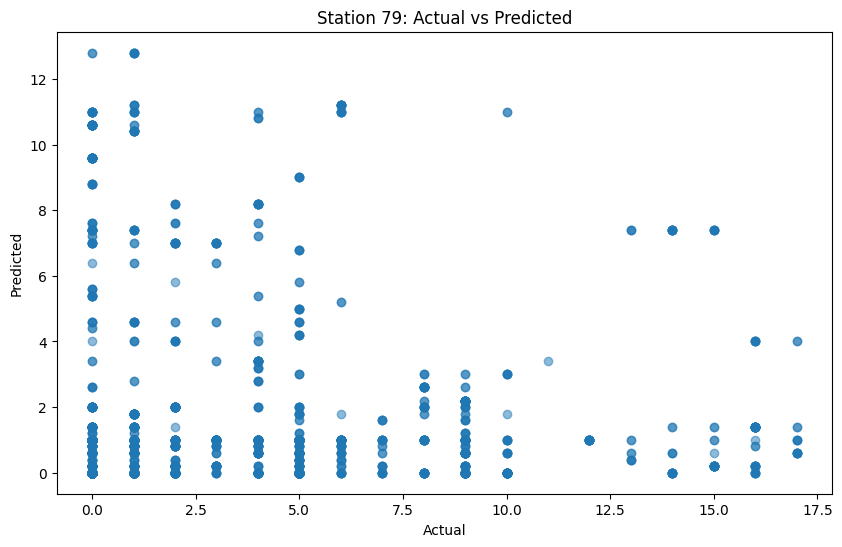

--------------------------------------------------
Number of predictions for station 59: 2202
Accuracy: 0.11852861035422343


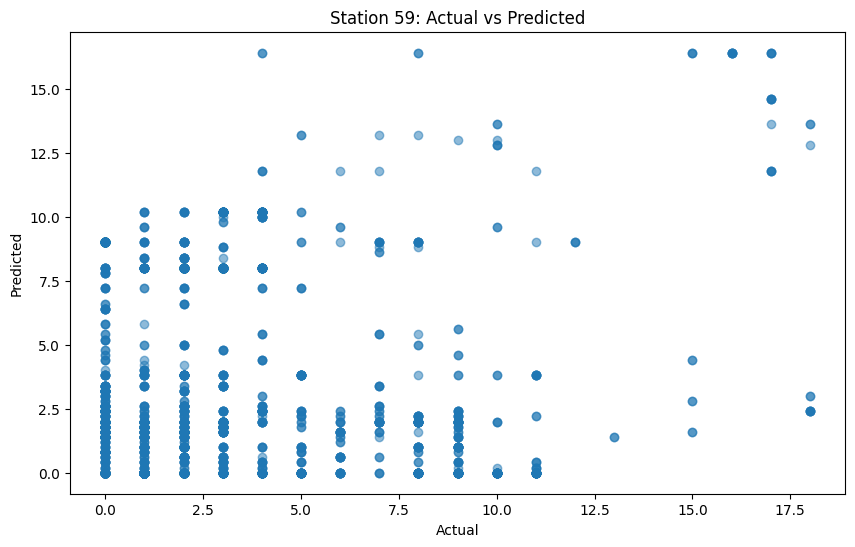

--------------------------------------------------
Number of predictions for station 4: 2202
Accuracy: 0.041326067211625794


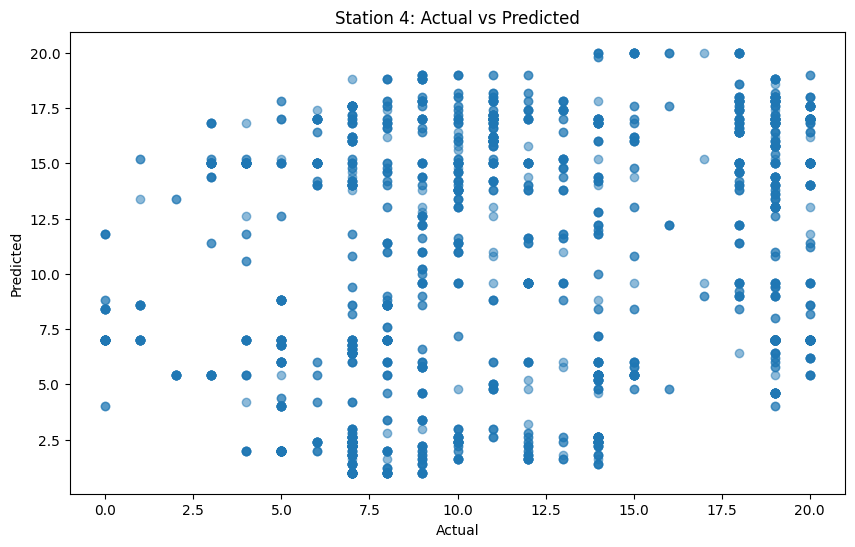

--------------------------------------------------
Number of predictions for station 94: 2202
Accuracy: 0.018165304268846504


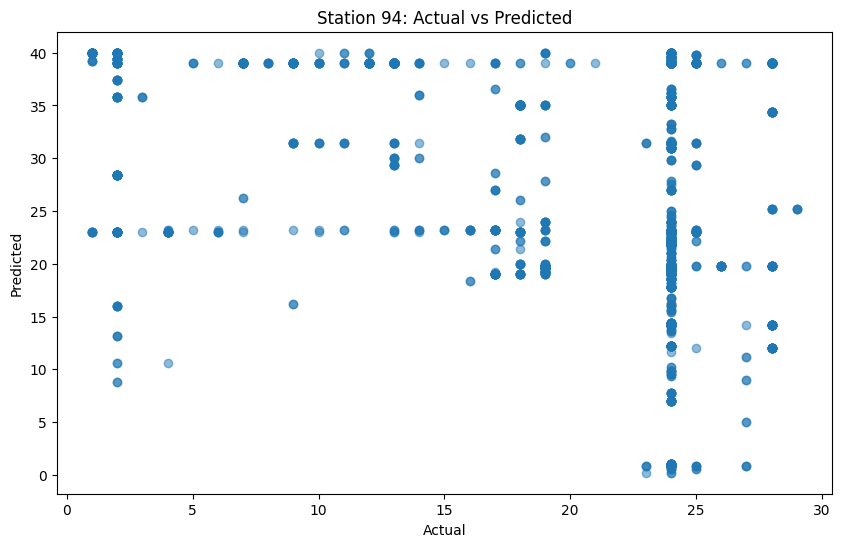

--------------------------------------------------
Number of predictions for station 73: 2202
Accuracy: 0.05131698455949137


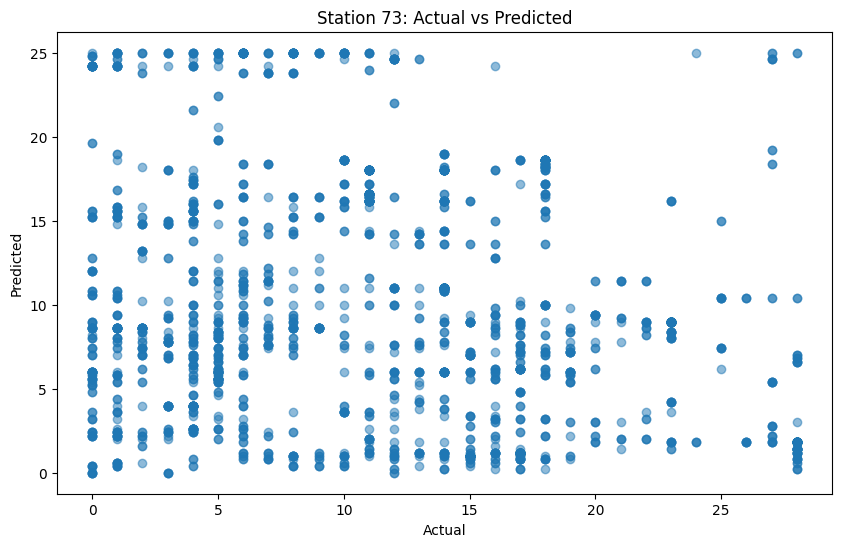

--------------------------------------------------
Number of predictions for station 72: 2202
Accuracy: 0.02997275204359673


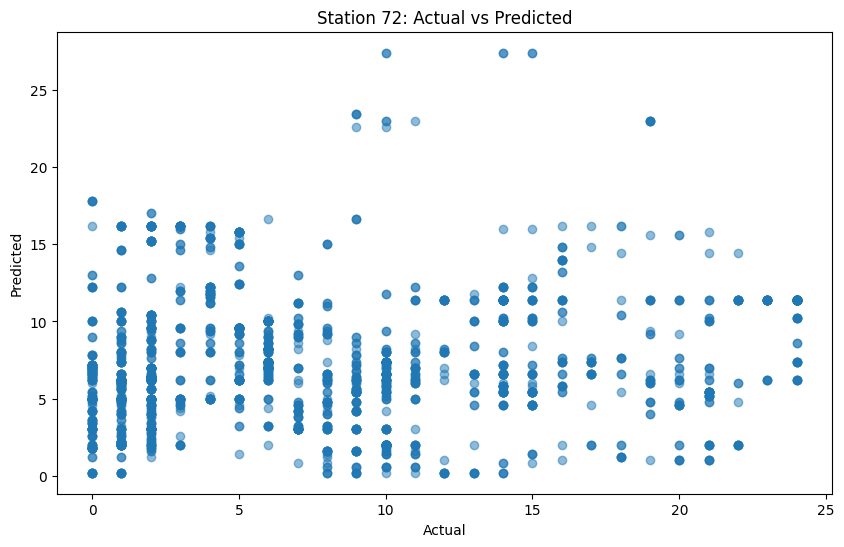

--------------------------------------------------
Number of predictions for station 108: 2202
Accuracy: 0.03360581289736603


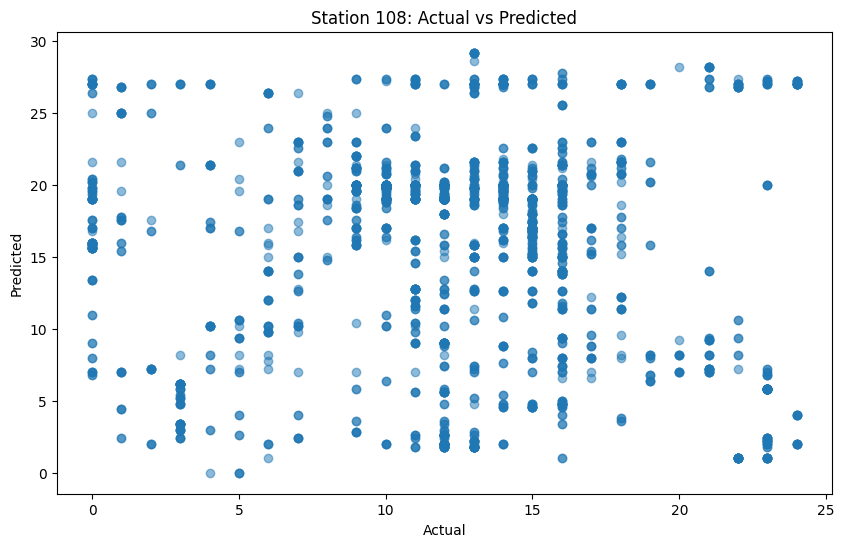

--------------------------------------------------
Number of predictions for station 99: 2202
Accuracy: 0.04405086285195277


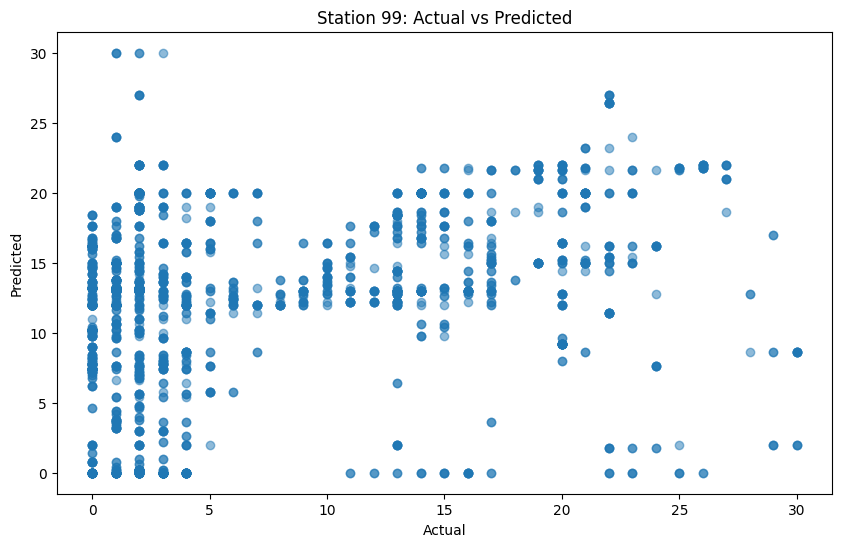

--------------------------------------------------
Number of predictions for station 18: 2202
Accuracy: 0.0340599455040872


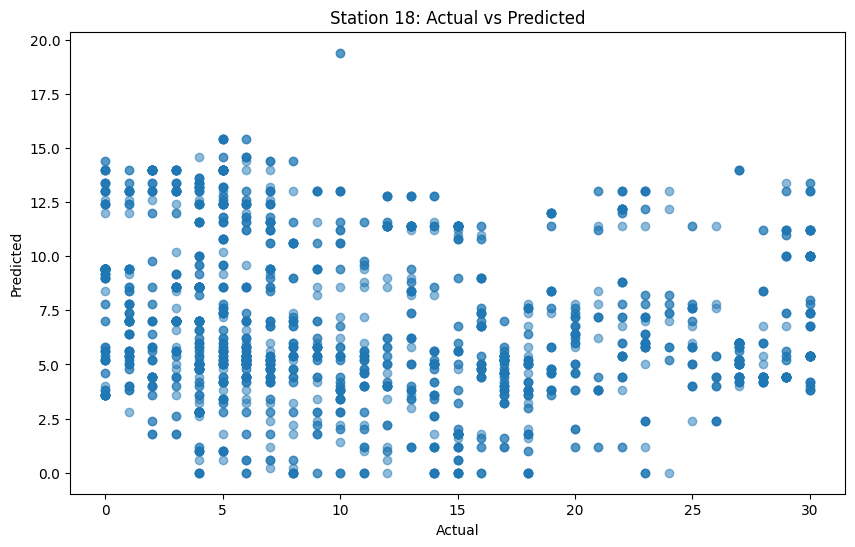

--------------------------------------------------
Number of predictions for station 82: 2202
Accuracy: 0.05040871934604905


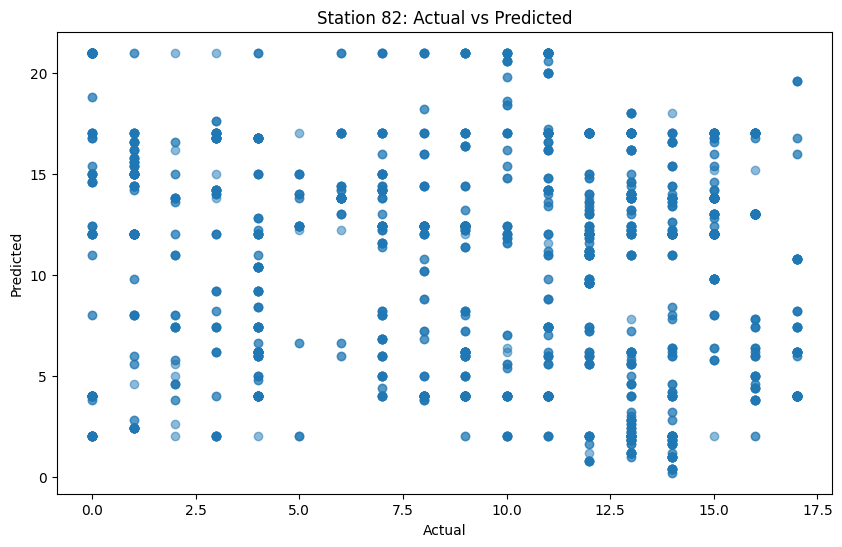

--------------------------------------------------
Number of predictions for station 24: 2202
Accuracy: 0.08991825613079019


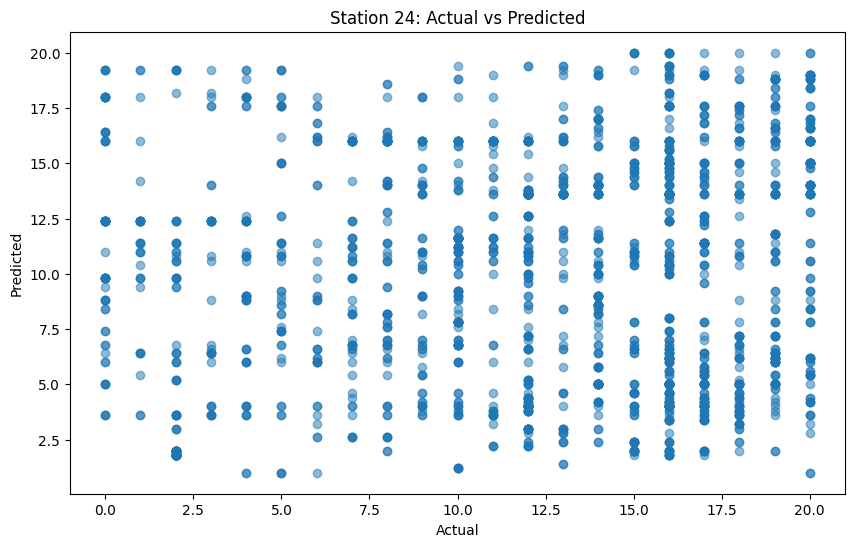

--------------------------------------------------
Number of predictions for station 74: 2202
Accuracy: 0.04586739327883742


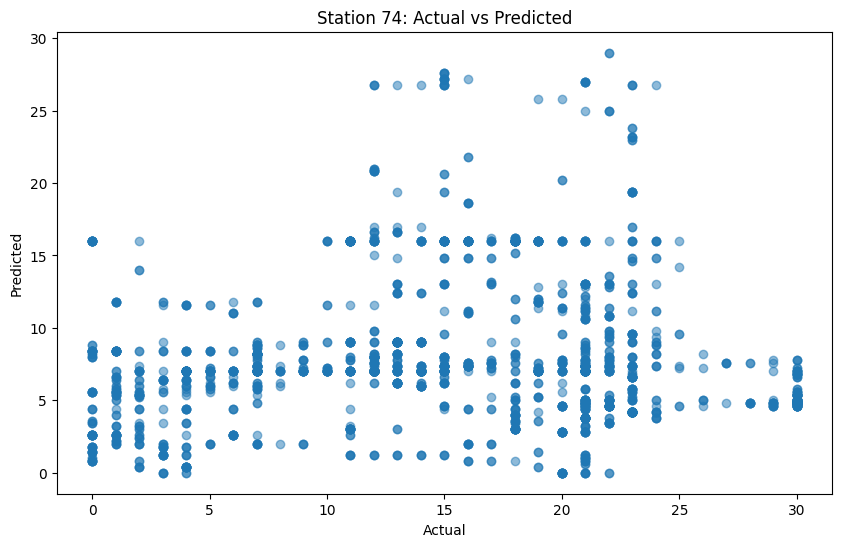

--------------------------------------------------
Number of predictions for station 44: 2202
Accuracy: 0.10263396911898275


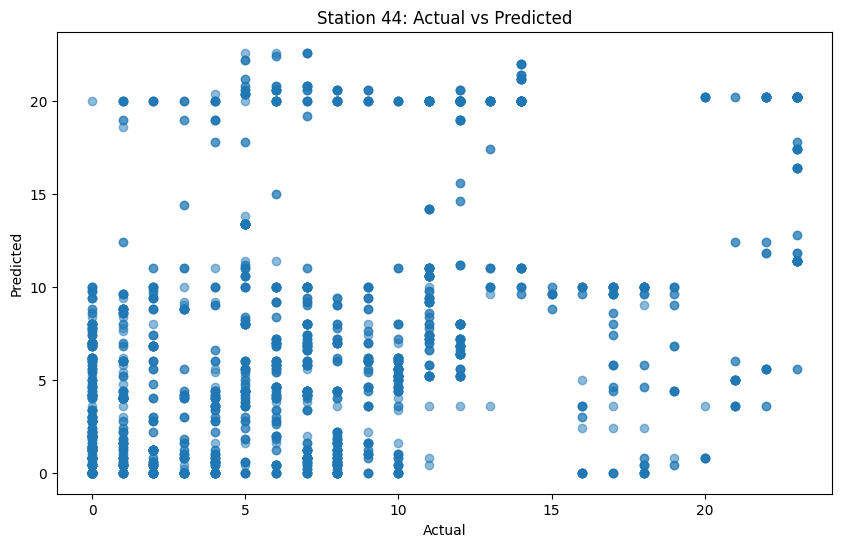

--------------------------------------------------
Number of predictions for station 1: 2202
Accuracy: 0.08900999091734786


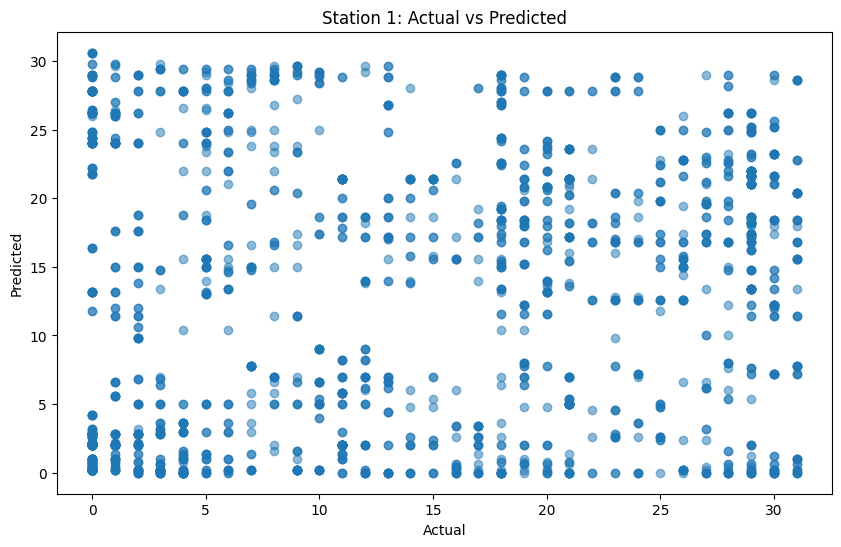

--------------------------------------------------
Number of predictions for station 89: 2202
Accuracy: 0.23251589464123523


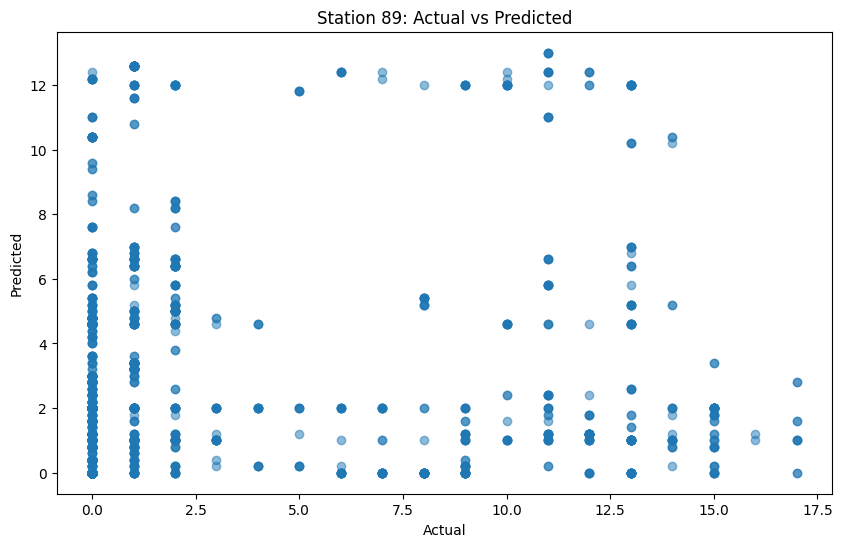

--------------------------------------------------
Number of predictions for station 84: 2202
Accuracy: 0.059491371480472295


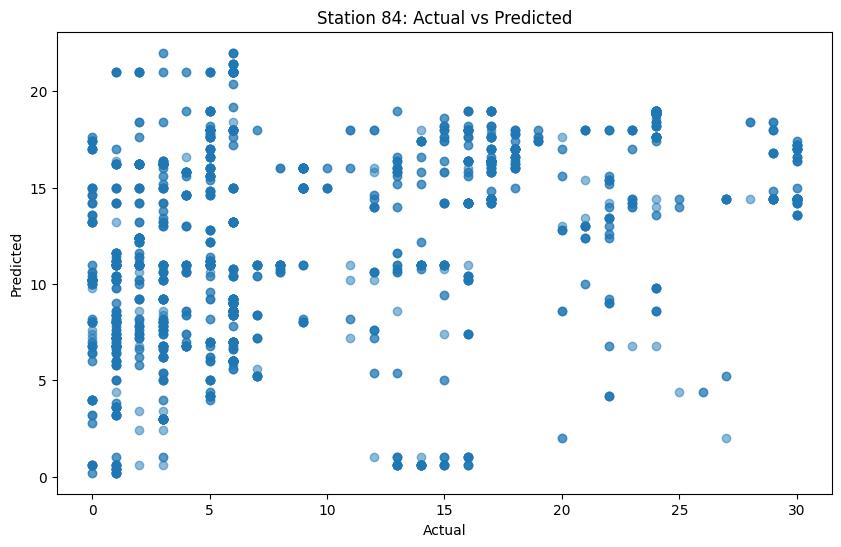

--------------------------------------------------
Number of predictions for station 6: 2202
Accuracy: 0.1030881017257039


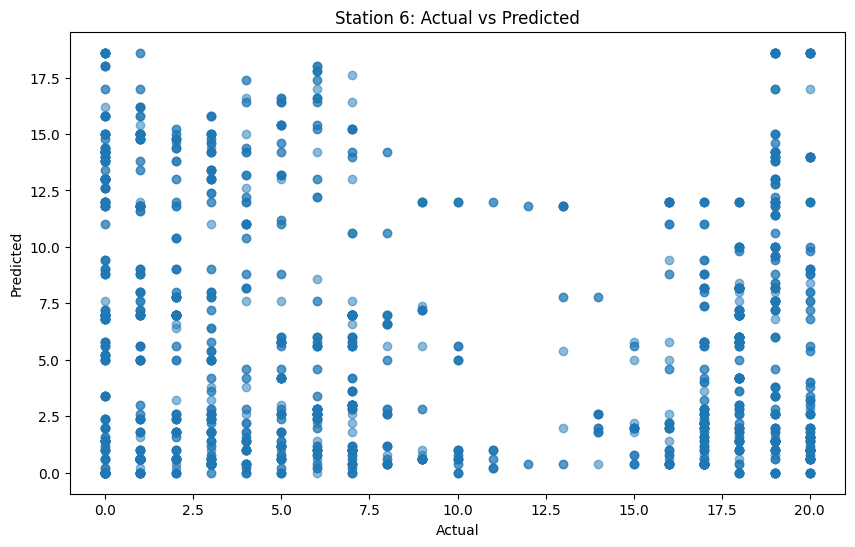

--------------------------------------------------
Number of predictions for station 52: 2202
Accuracy: 0.06721162579473206


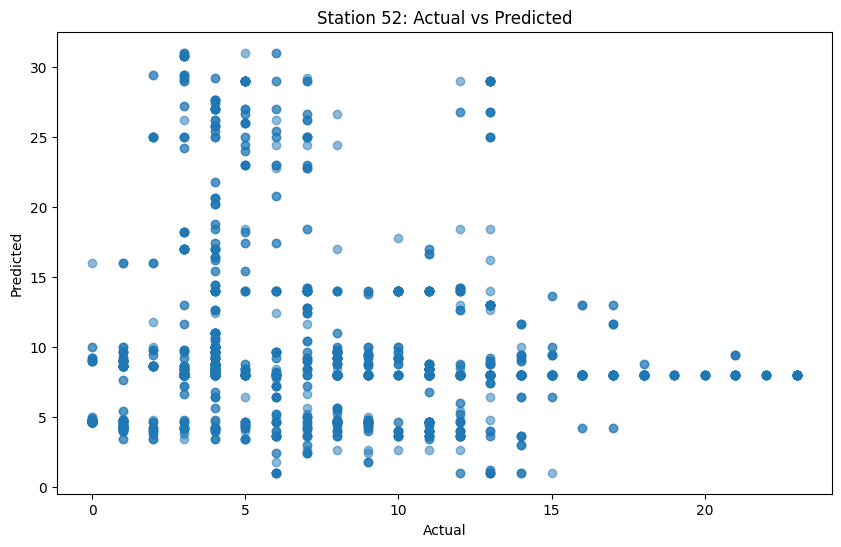

--------------------------------------------------
Number of predictions for station 110: 2202
Accuracy: 0.03451407811080836


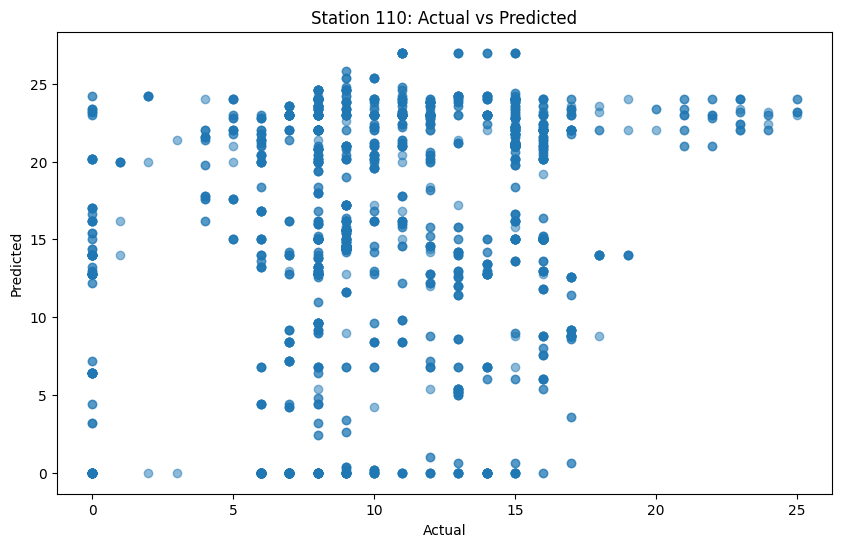

--------------------------------------------------
Number of predictions for station 34: 2202
Accuracy: 0.049954586739327886


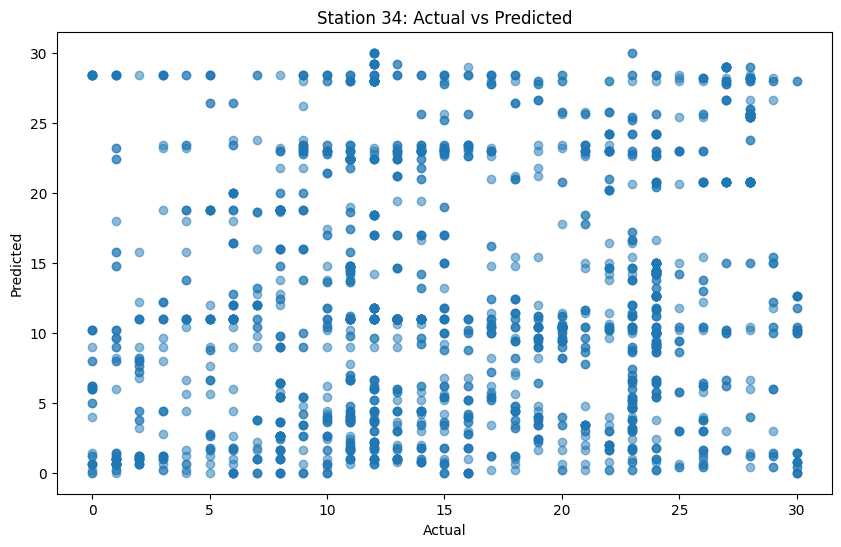

--------------------------------------------------
Number of predictions for station 29: 2202
Accuracy: 0.04904632152588556


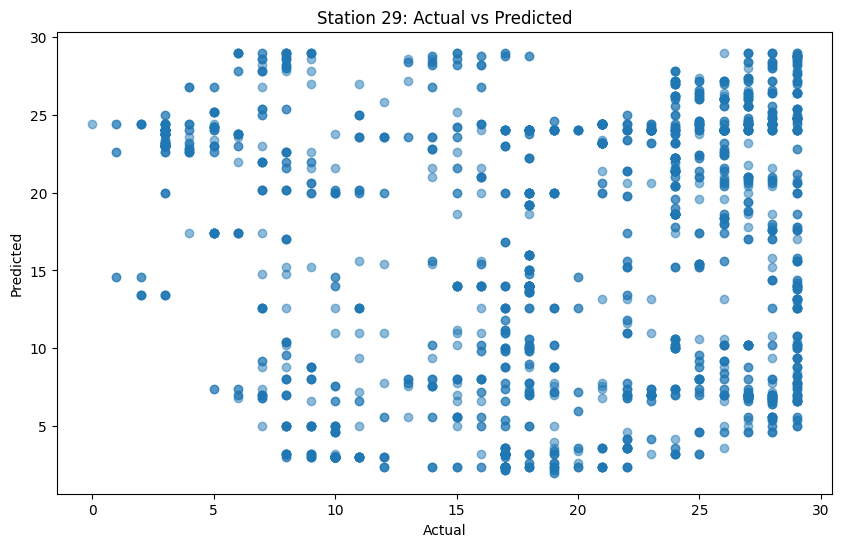

--------------------------------------------------
Number of predictions for station 105: 2202
Accuracy: 0.12125340599455041


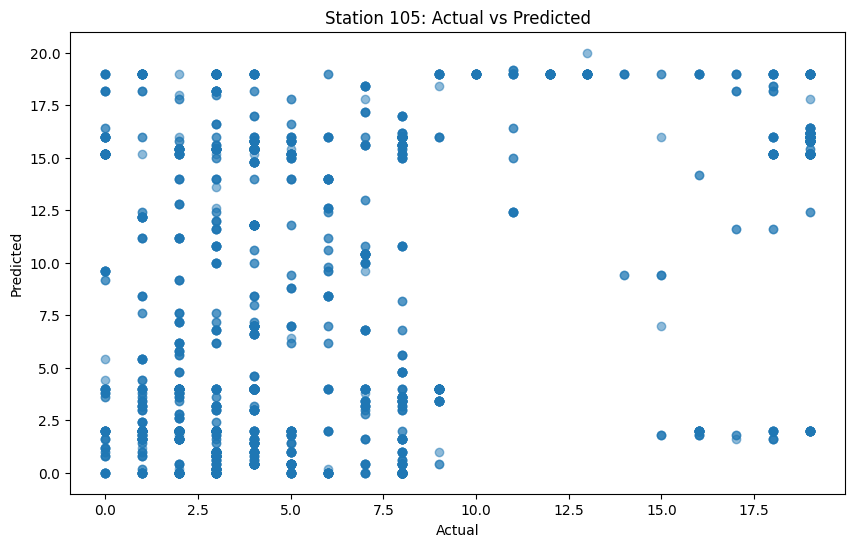

--------------------------------------------------
Number of predictions for station 17: 2202
Accuracy: 0.09309718437783833


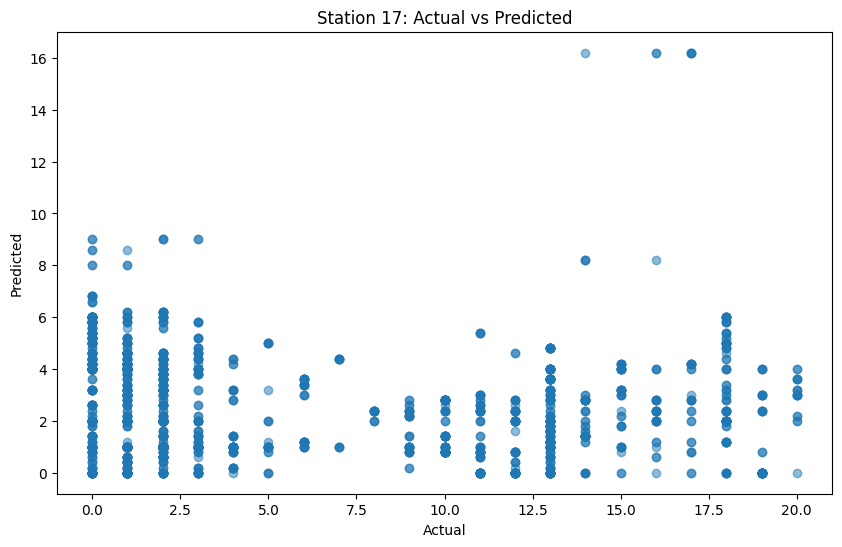

--------------------------------------------------
Number of predictions for station 80: 2202
Accuracy: 0.031335149863760216


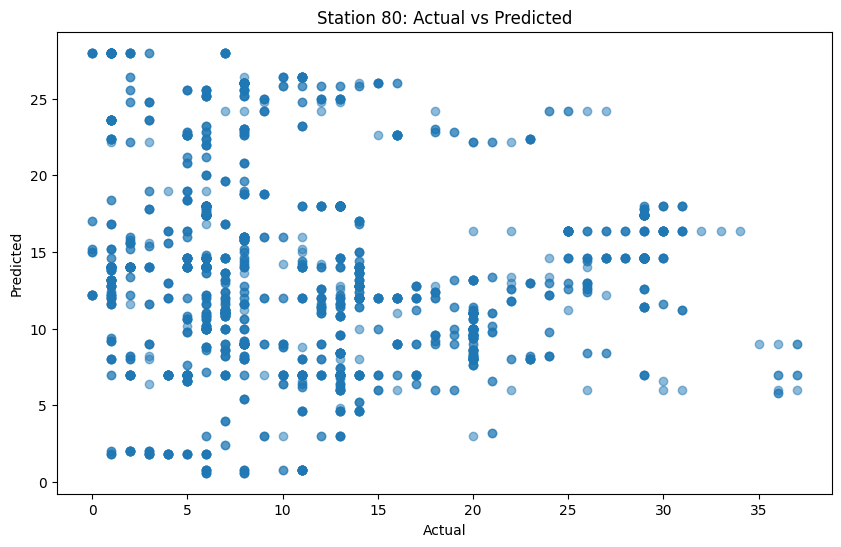

--------------------------------------------------
Number of predictions for station 15: 2202
Accuracy: 0.13760217983651227


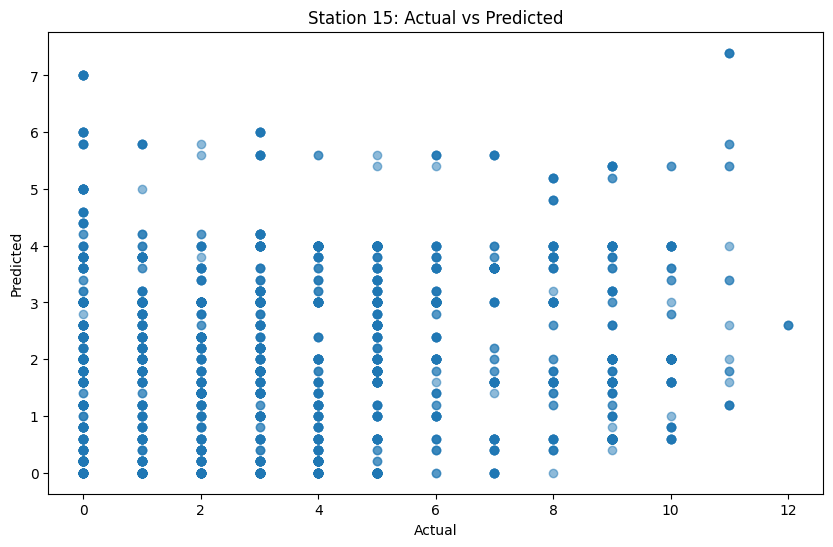

--------------------------------------------------
Number of predictions for station 91: 2202
Accuracy: 0.049954586739327886


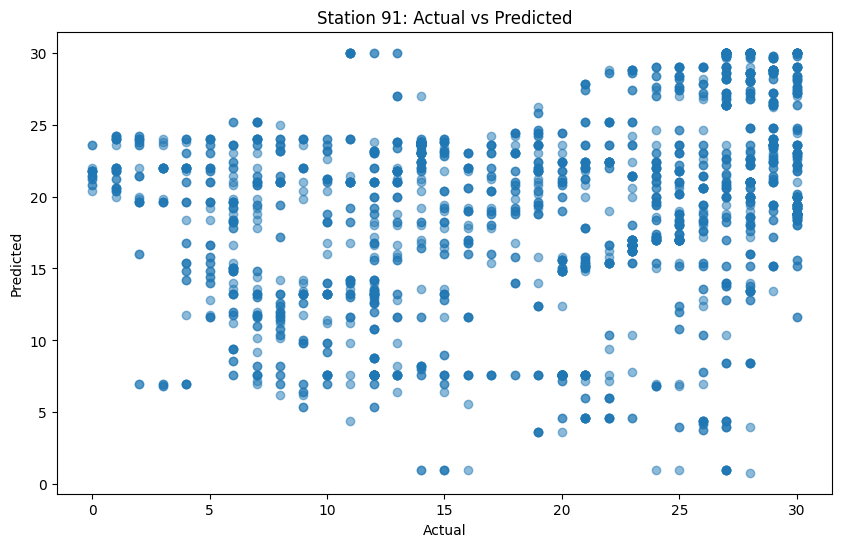

--------------------------------------------------
Number of predictions for station 45: 2202
Accuracy: 0.047683923705722074


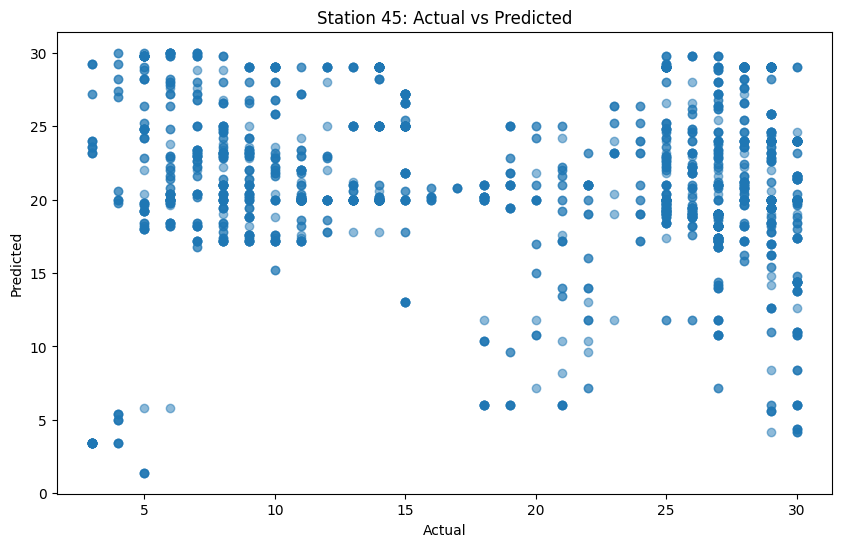

--------------------------------------------------
Number of predictions for station 20: 2202
Accuracy: 0.24114441416893734


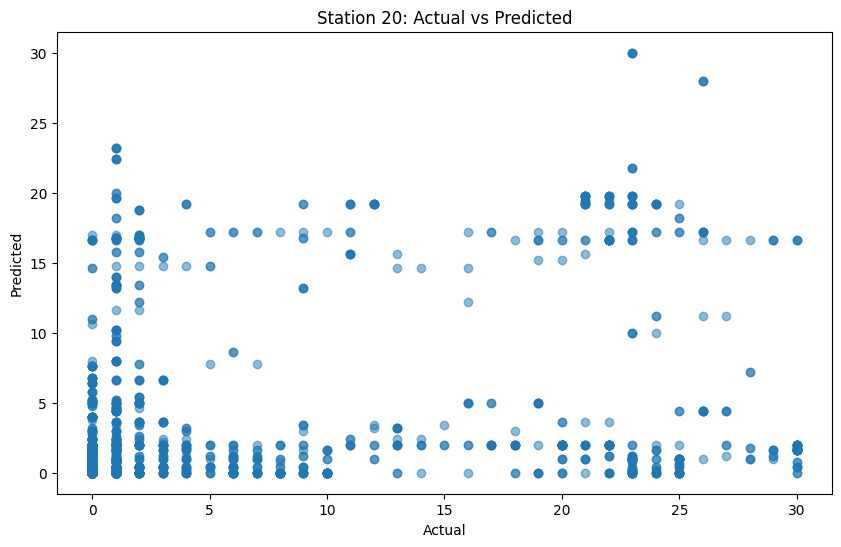

--------------------------------------------------
Number of predictions for station 21: 2202
Accuracy: 0.035422343324250684


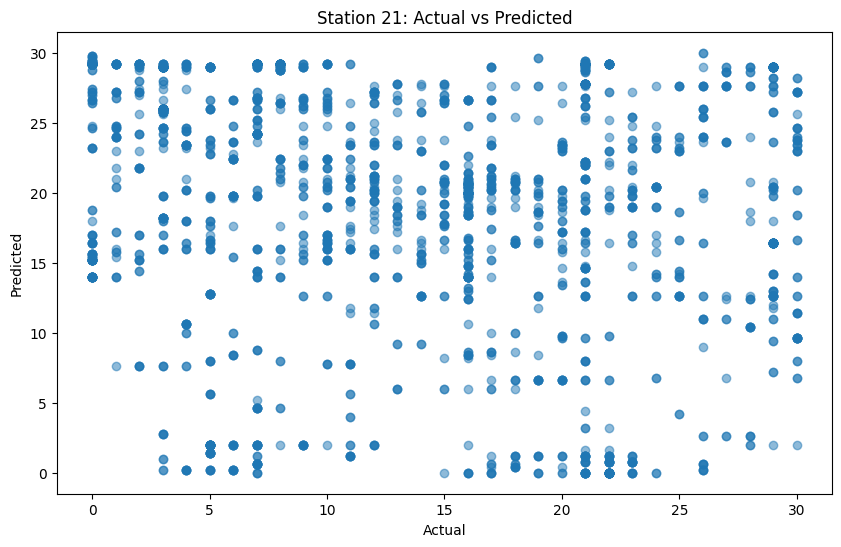

--------------------------------------------------
Number of predictions for station 64: 2202
Accuracy: 0.02633969118982743


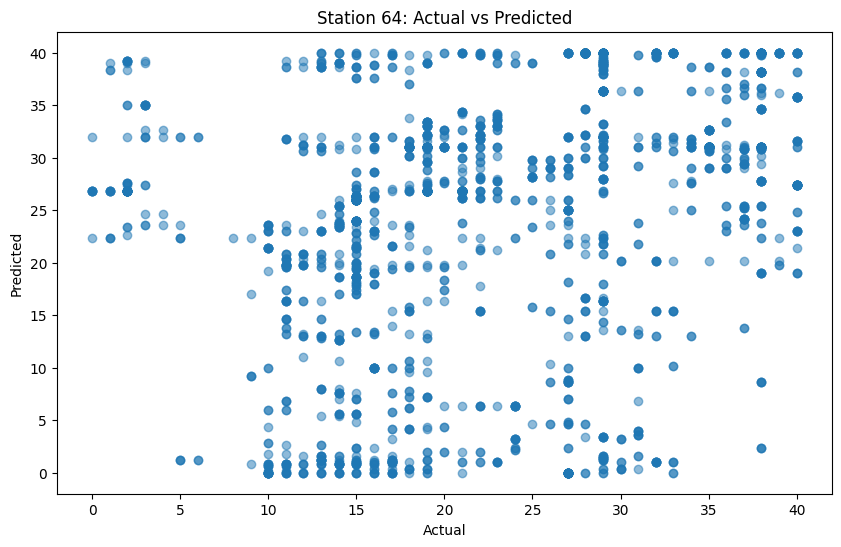

--------------------------------------------------
Number of predictions for station 54: 2202
Accuracy: 0.061762034514078114


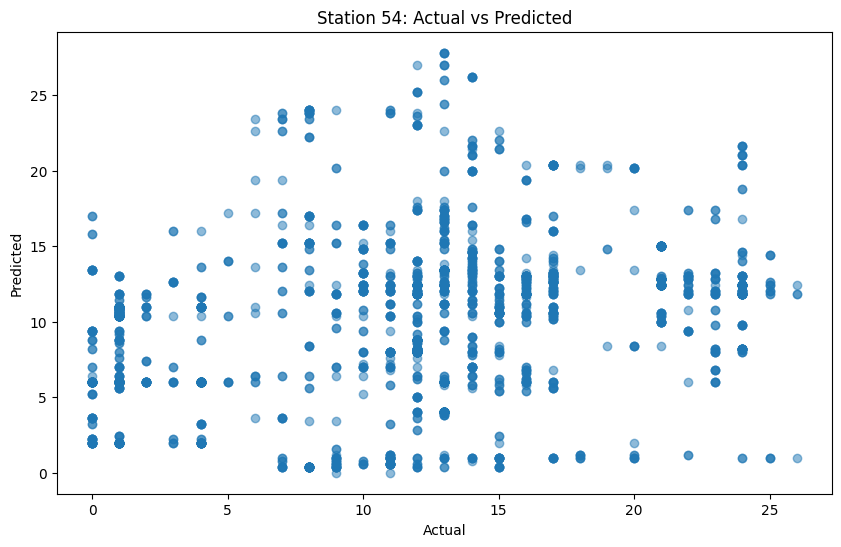

--------------------------------------------------
Number of predictions for station 114: 2202
Accuracy: 0.13987284287011809


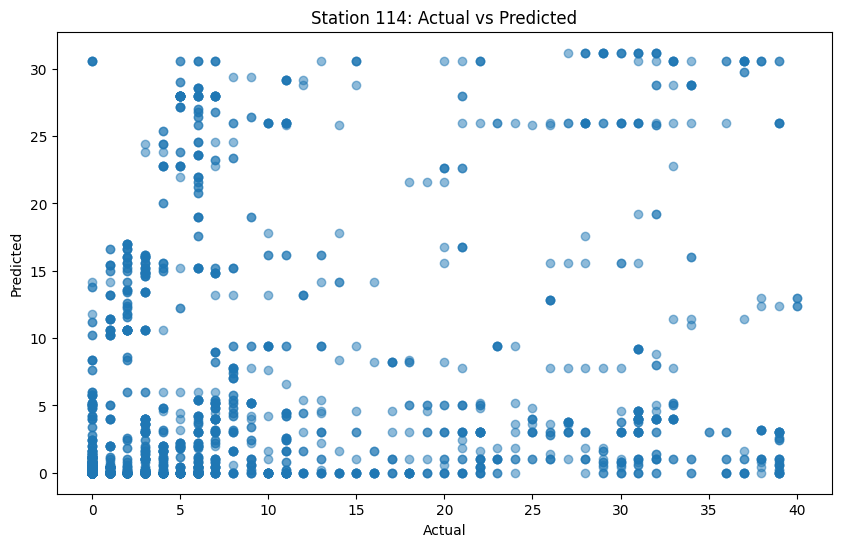

--------------------------------------------------
Number of predictions for station 50: 2202
Accuracy: 0.021798365122615803


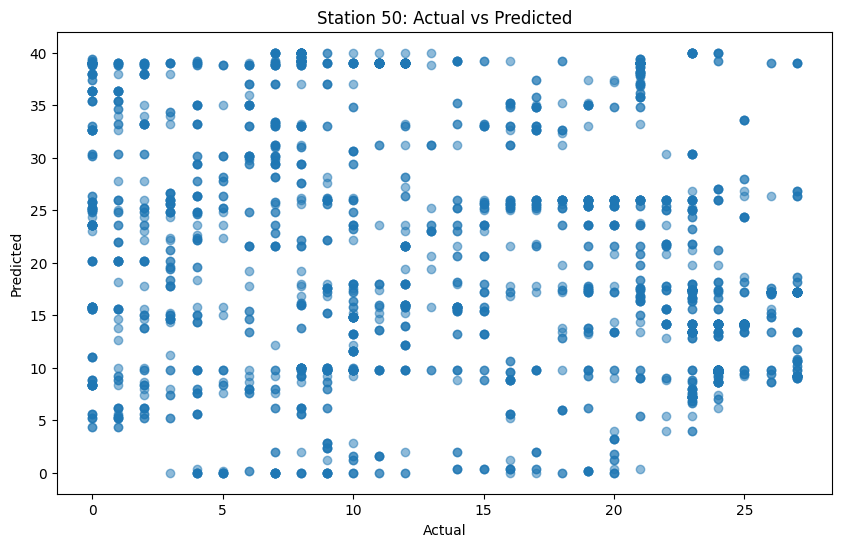

--------------------------------------------------
Number of predictions for station 75: 2202
Accuracy: 0.03633060853769301


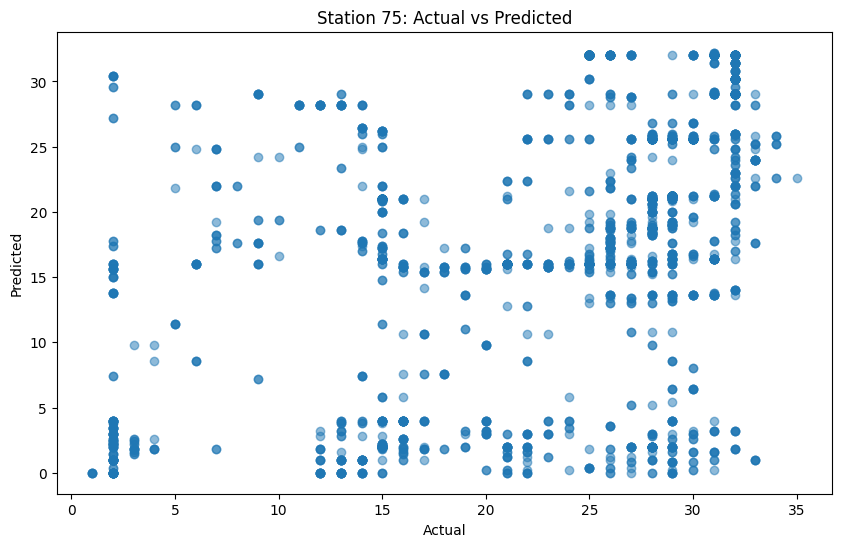

--------------------------------------------------
Number of predictions for station 92: 2202
Accuracy: 0.047683923705722074


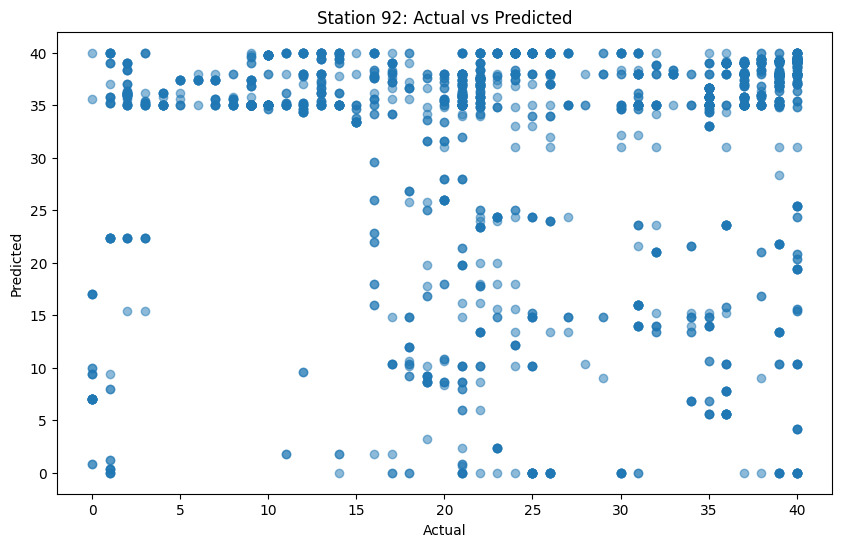

--------------------------------------------------
Number of predictions for station 55: 2202
Accuracy: 0.1639418710263397


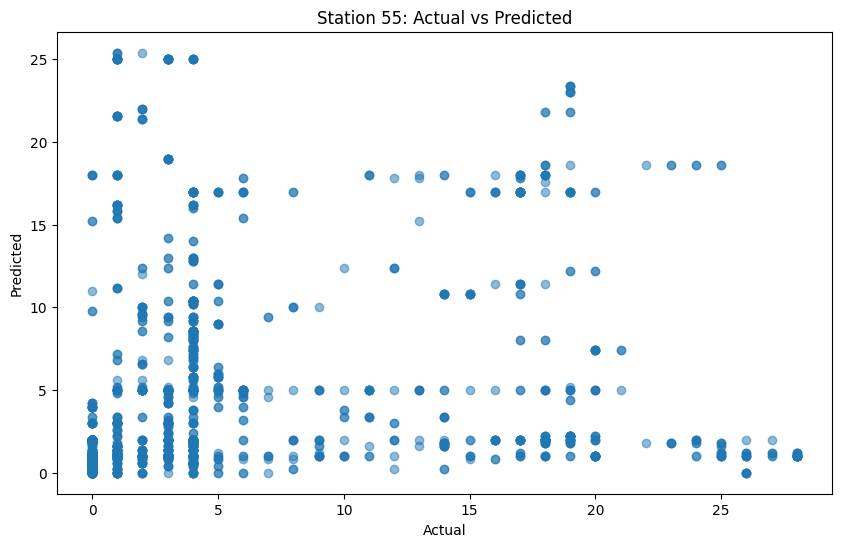

--------------------------------------------------
Number of predictions for station 65: 2202
Accuracy: 0.07084468664850137


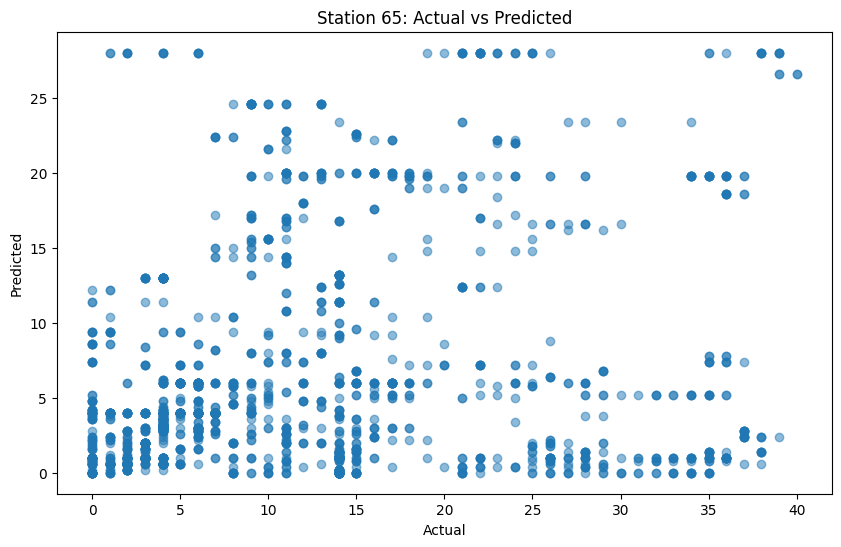

--------------------------------------------------
Number of predictions for station 98: 2202
Accuracy: 0.011807447774750226


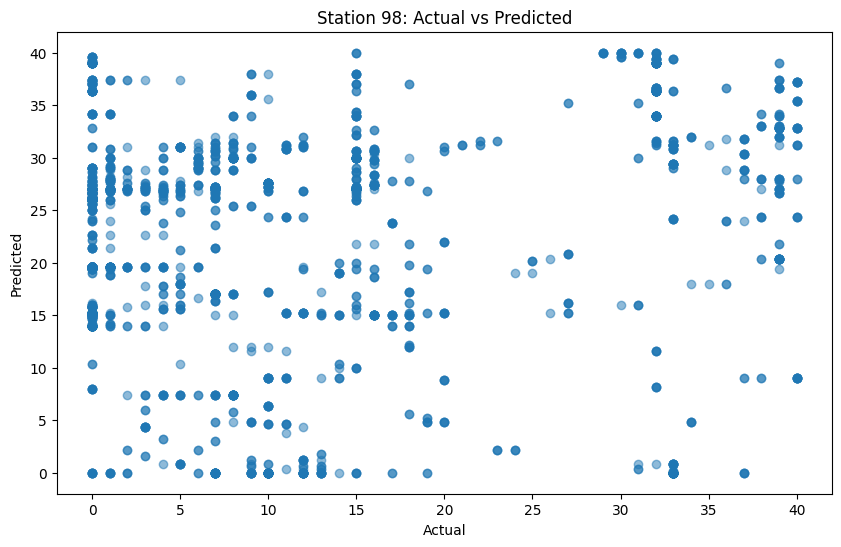

--------------------------------------------------
Number of predictions for station 62: 2202
Accuracy: 0.03178928247048138


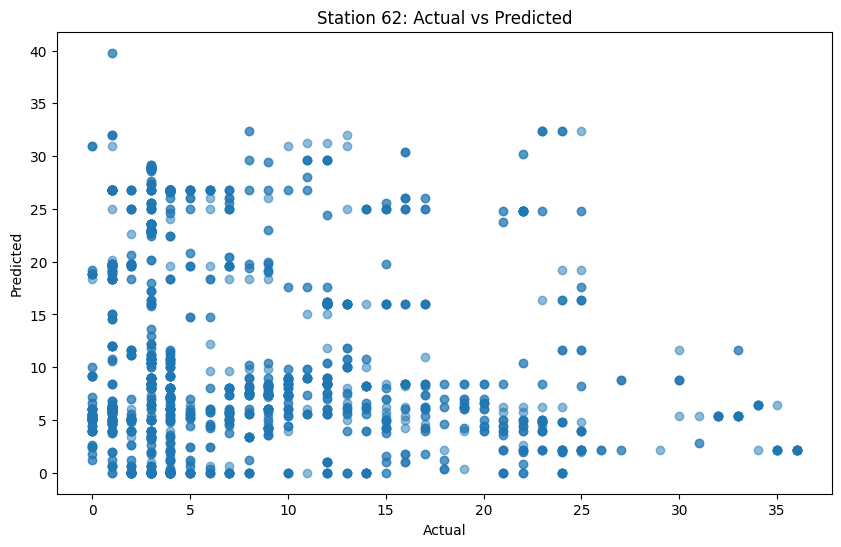

--------------------------------------------------
Number of predictions for station 90: 2202
Accuracy: 0.04178019981834696


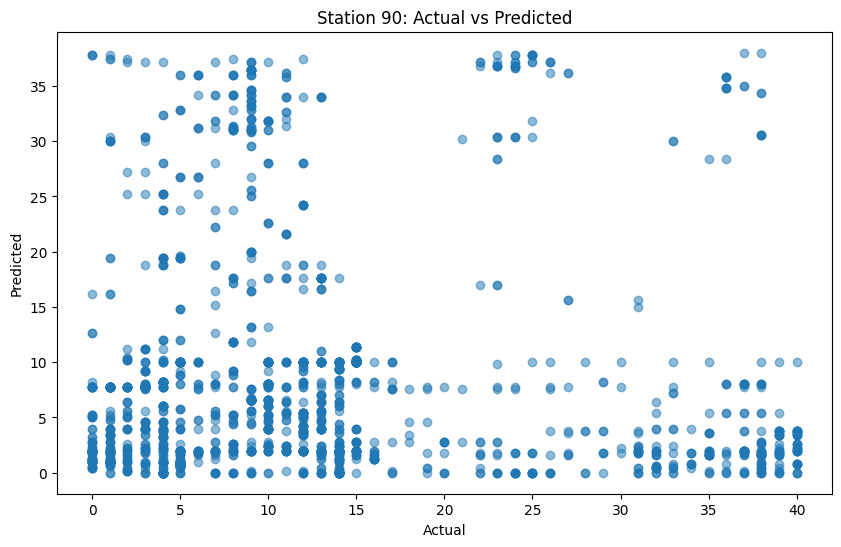

--------------------------------------------------
Number of predictions for station 2: 2202
Accuracy: 0.11534968210717529


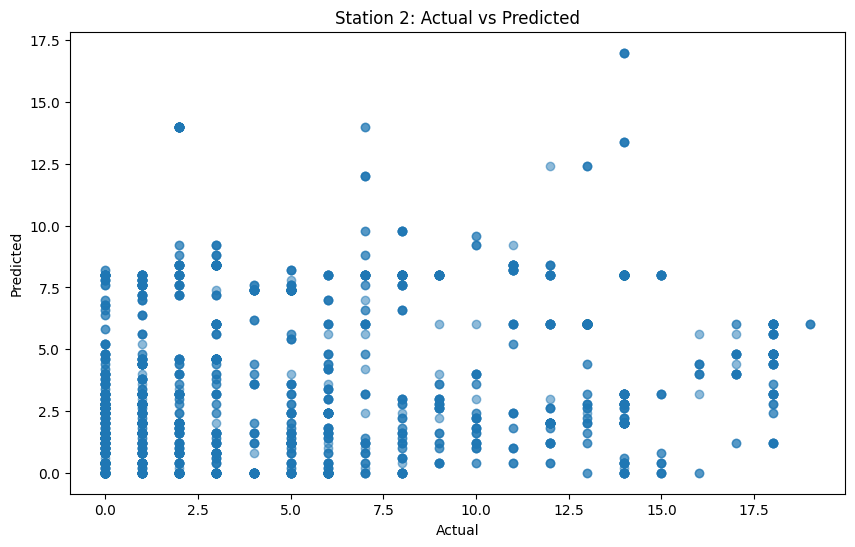

--------------------------------------------------
Number of predictions for station 33: 2202
Accuracy: 0.0703905540417802


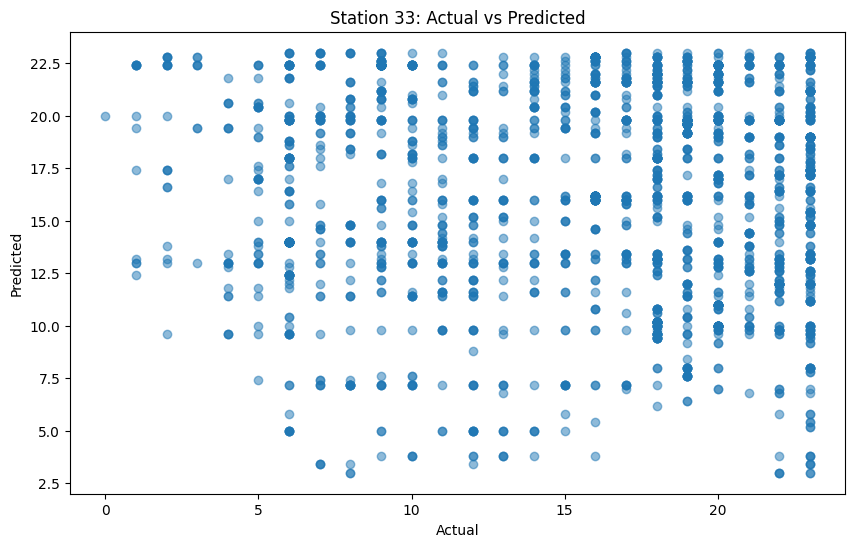

--------------------------------------------------
Number of predictions for station 60: 2202
Accuracy: 0.04495912806539509


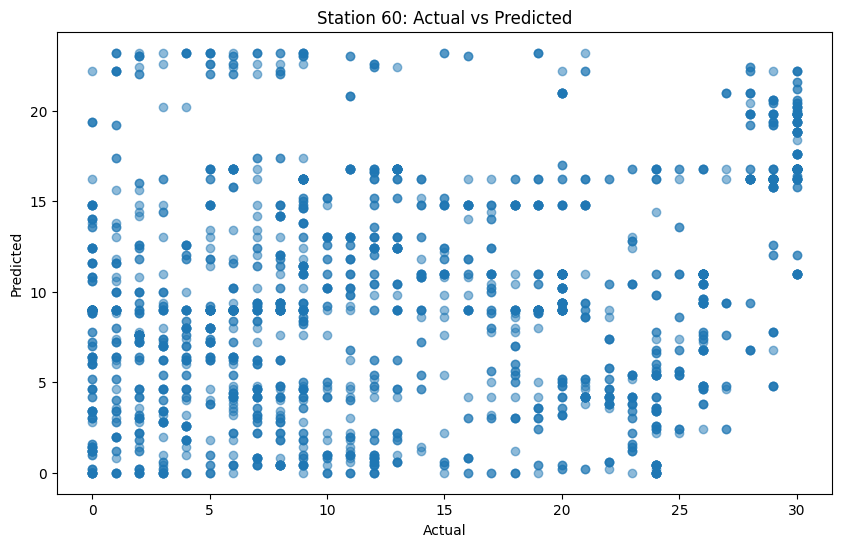

--------------------------------------------------
Number of predictions for station 116: 2202
Accuracy: 0.06130790190735695


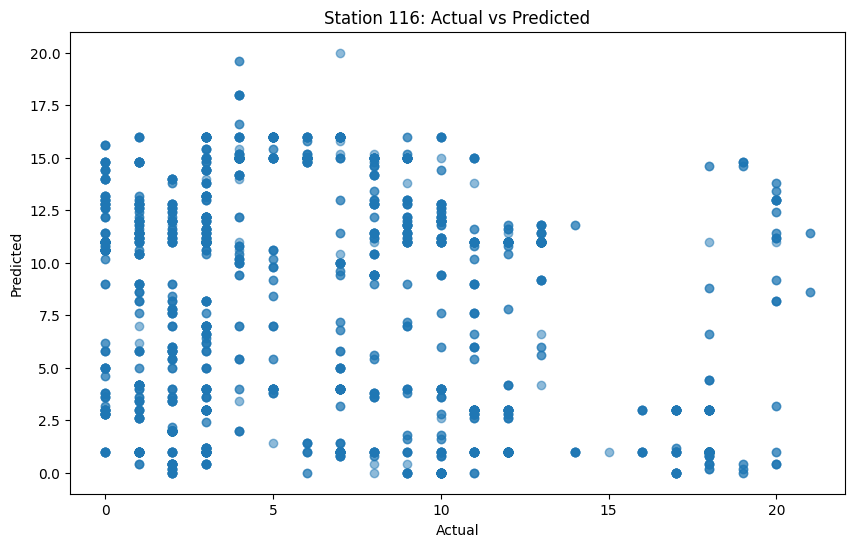

--------------------------------------------------
Number of predictions for station 43: 2202
Accuracy: 0.04495912806539509


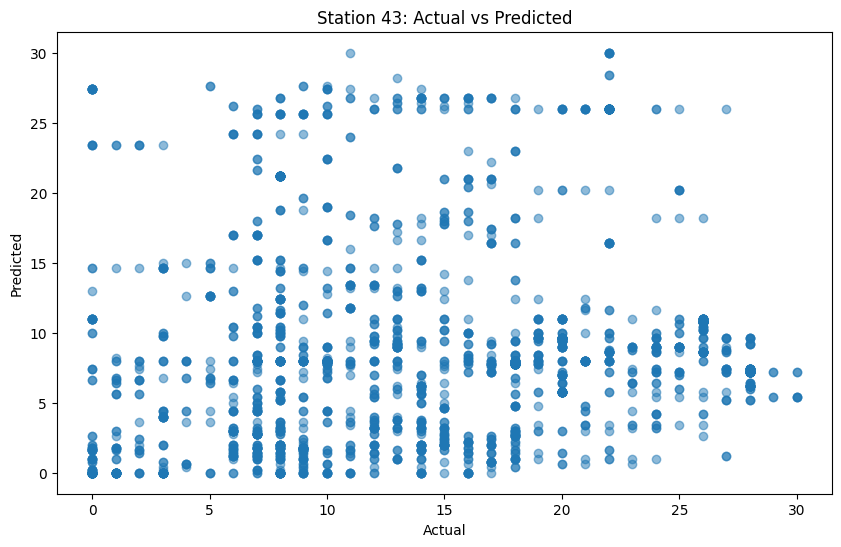

--------------------------------------------------
Number of predictions for station 49: 2202
Accuracy: 0.009082652134423252


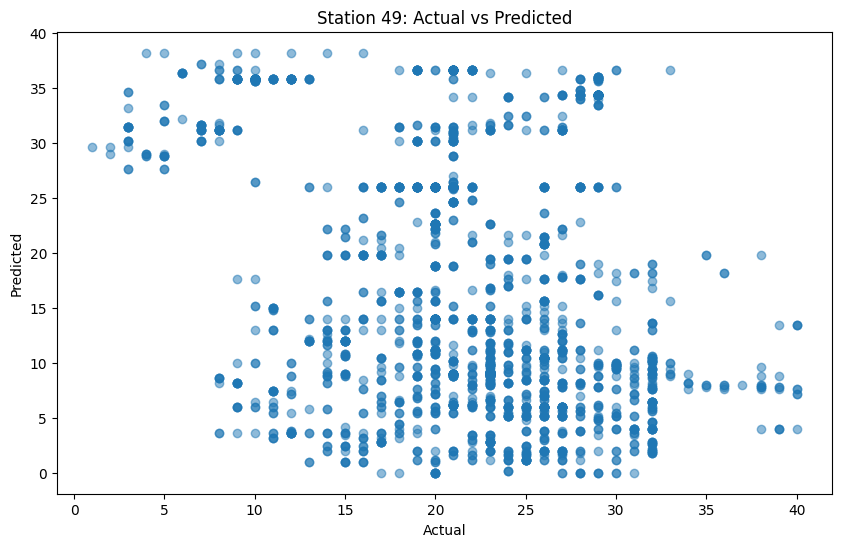

--------------------------------------------------
Number of predictions for station 25: 2202
Accuracy: 0.06130790190735695


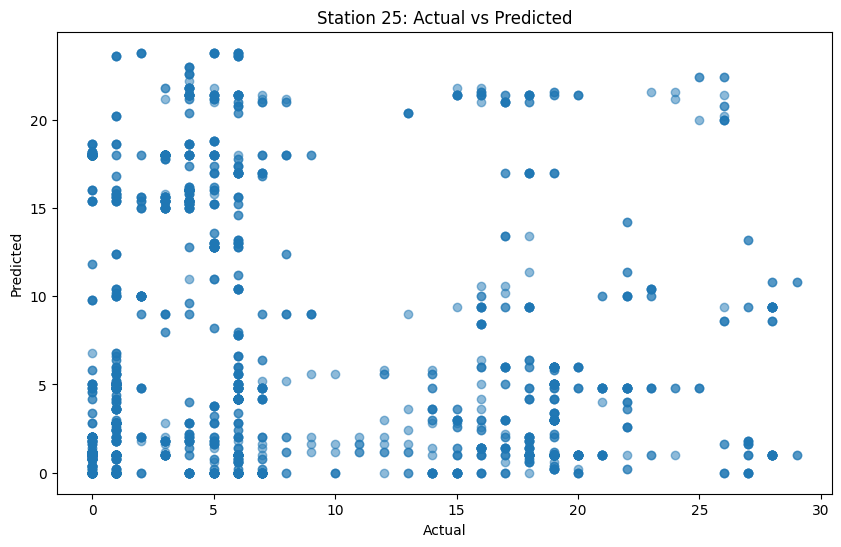

--------------------------------------------------
Number of predictions for station 10: 2202
Accuracy: 0.06130790190735695


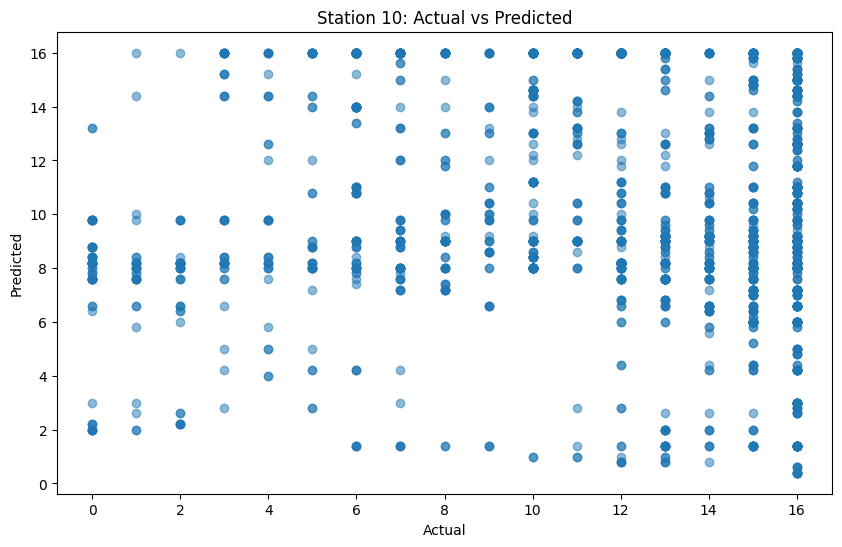

--------------------------------------------------
Number of predictions for station 88: 2202
Accuracy: 0.03905540417801998


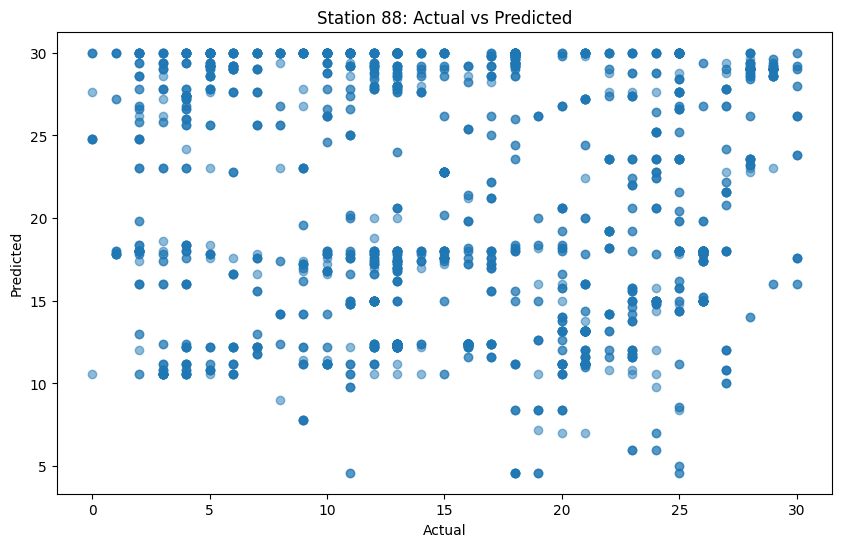

--------------------------------------------------
Number of predictions for station 9: 2202
Accuracy: 0.05812897366030881


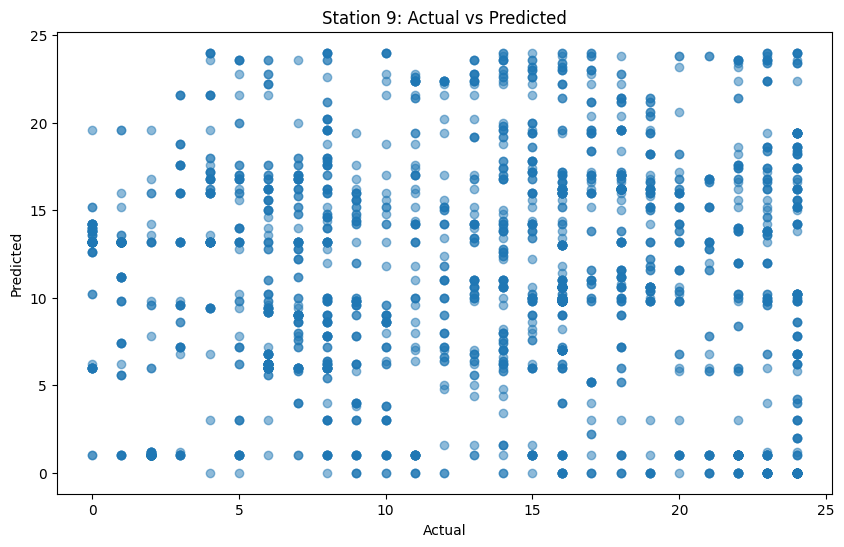

--------------------------------------------------
Number of predictions for station 19: 2202
Accuracy: 0.1344232515894641


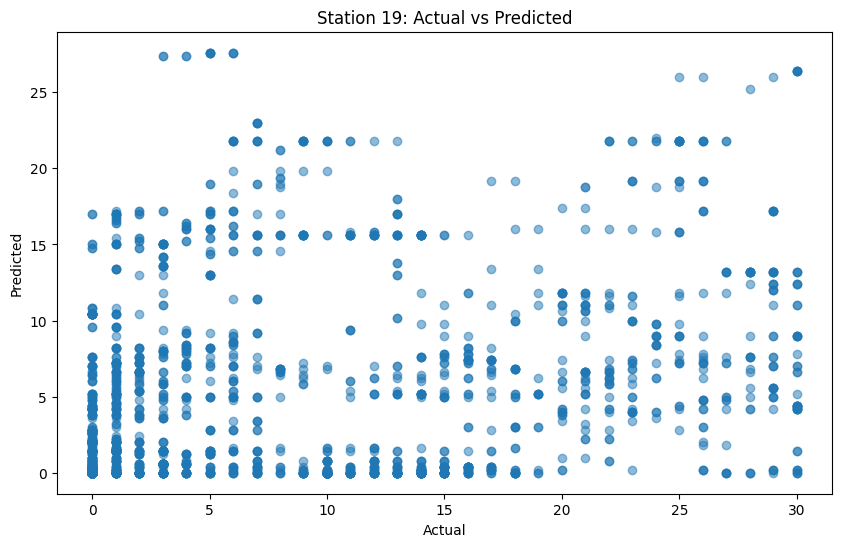

--------------------------------------------------
Number of predictions for station 5: 2202
Accuracy: 0.05313351498637602


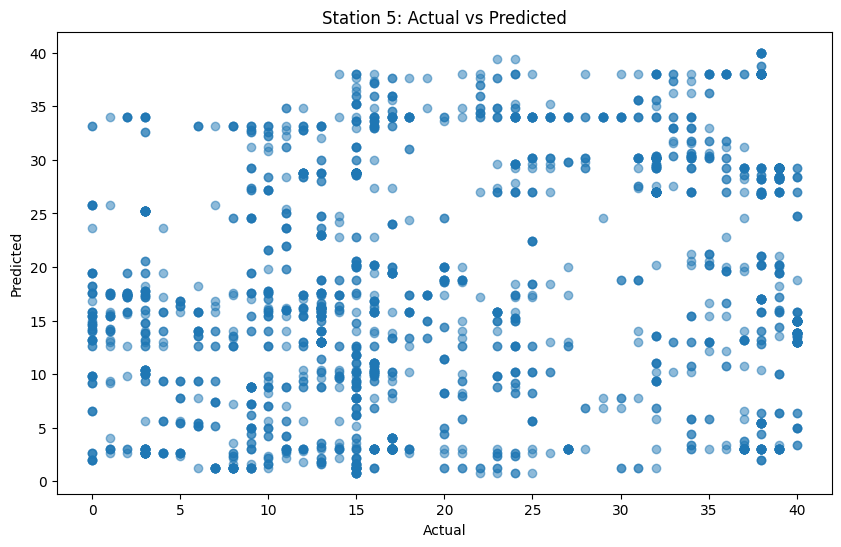

--------------------------------------------------
Number of predictions for station 85: 2202
Accuracy: 0.024977293369663943


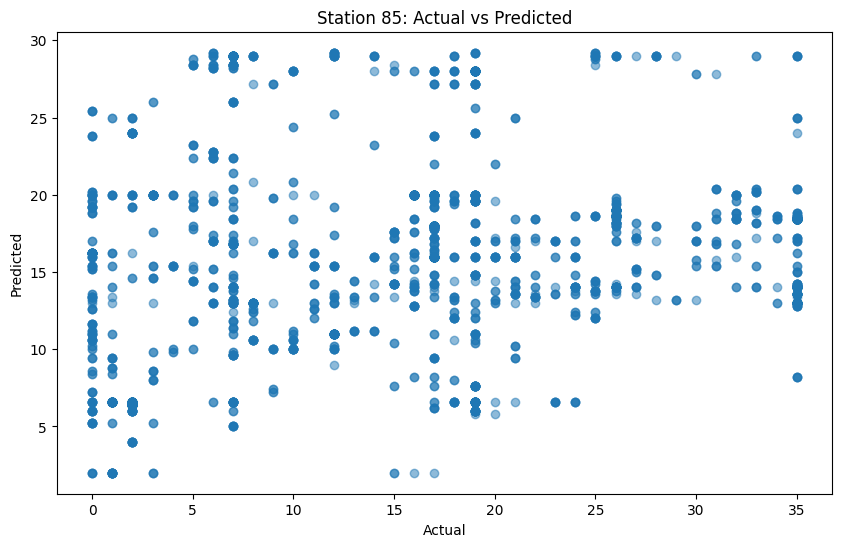

--------------------------------------------------
Number of predictions for station 68: 2202
Accuracy: 0.055404178019981834


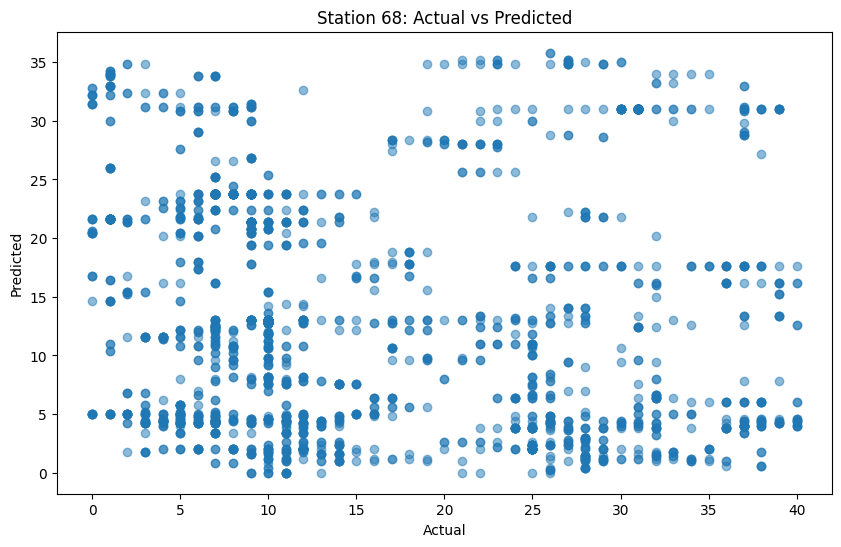

--------------------------------------------------
Number of predictions for station 58: 2202
Accuracy: 0.02089009990917348


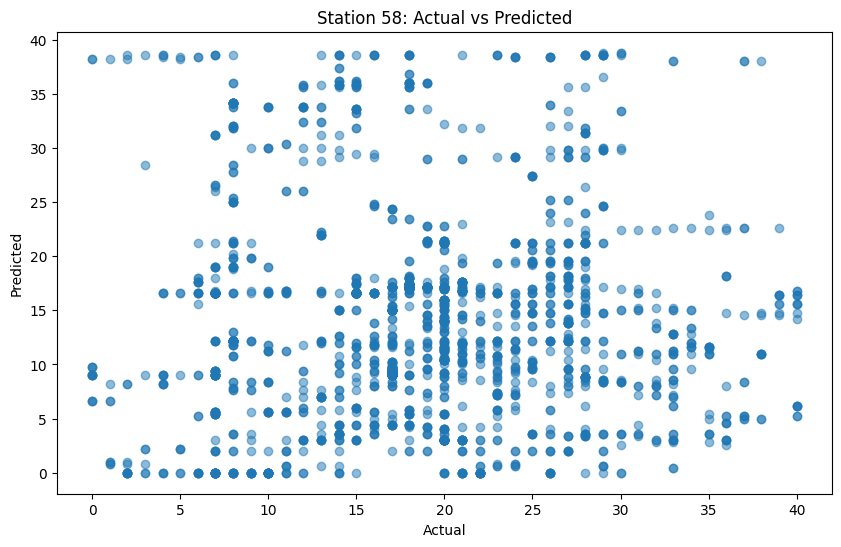

--------------------------------------------------
Number of predictions for station 109: 2202
Accuracy: 0.02089009990917348


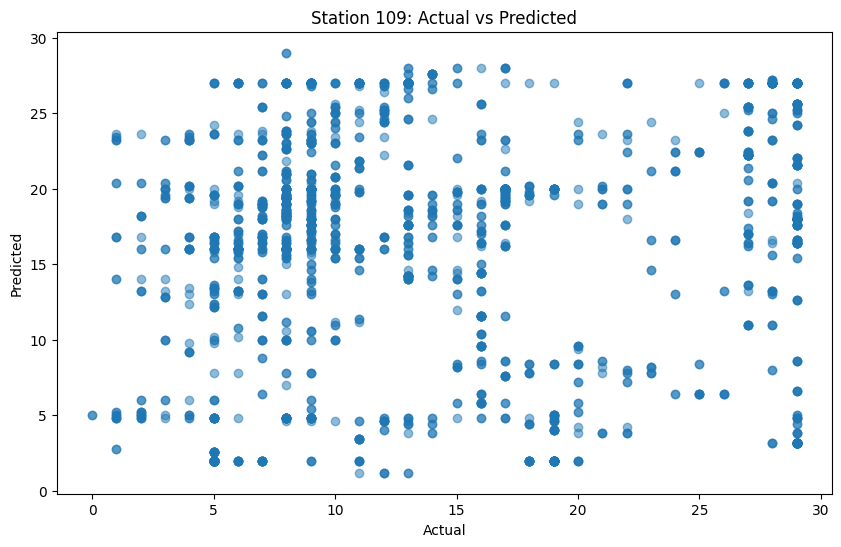

--------------------------------------------------
Number of predictions for station 67: 2202
Accuracy: 0.027247956403269755


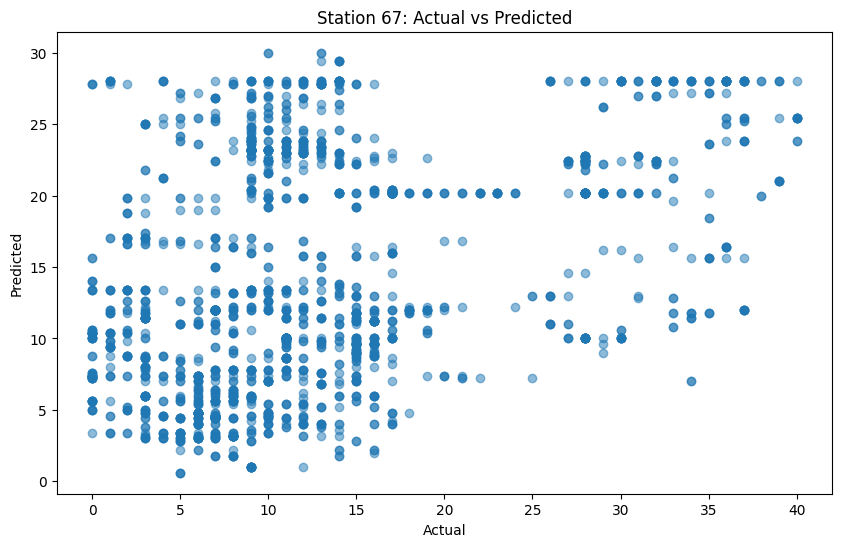

--------------------------------------------------
Number of predictions for station 35: 2202
Accuracy: 0.02997275204359673


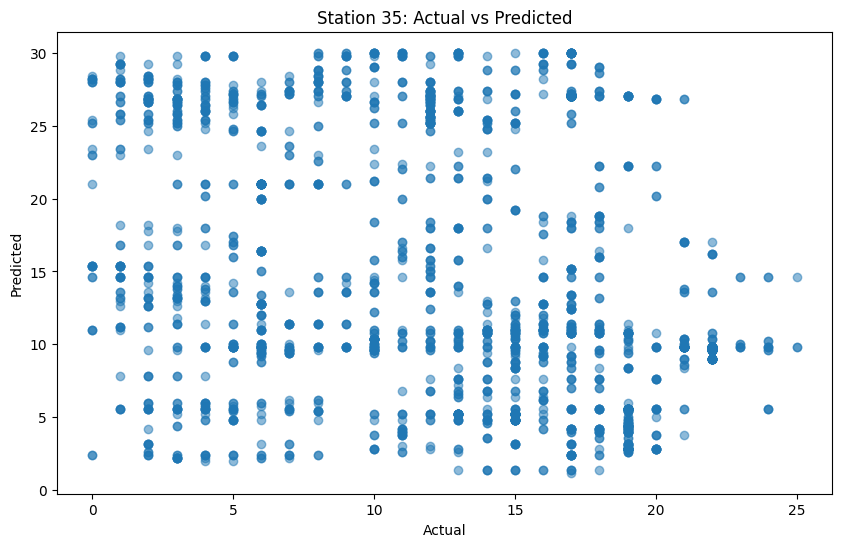

--------------------------------------------------
Number of predictions for station 32: 2202
Accuracy: 0.04904632152588556


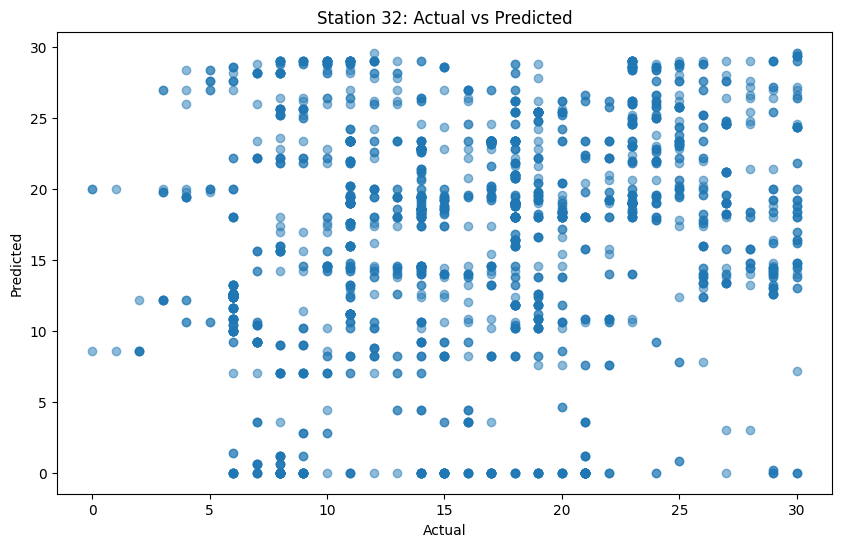

--------------------------------------------------
Number of predictions for station 71: 2202
Accuracy: 0.048138056312443236


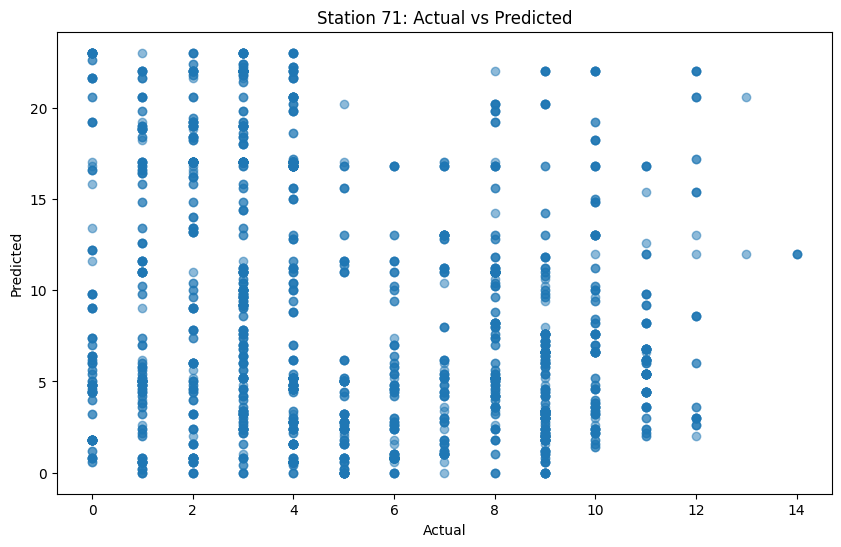

--------------------------------------------------
Number of predictions for station 95: 2202
Accuracy: 0.08810172570390554


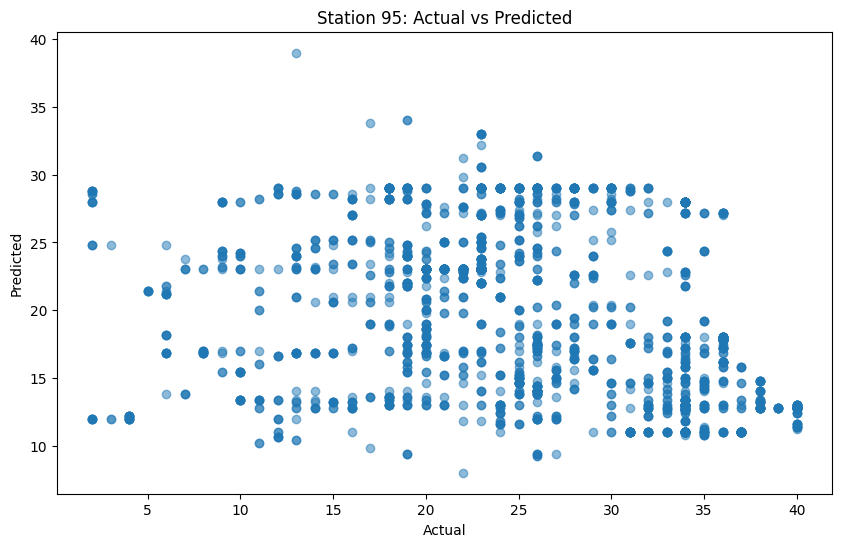

--------------------------------------------------
Number of predictions for station 83: 2202
Accuracy: 0.035422343324250684


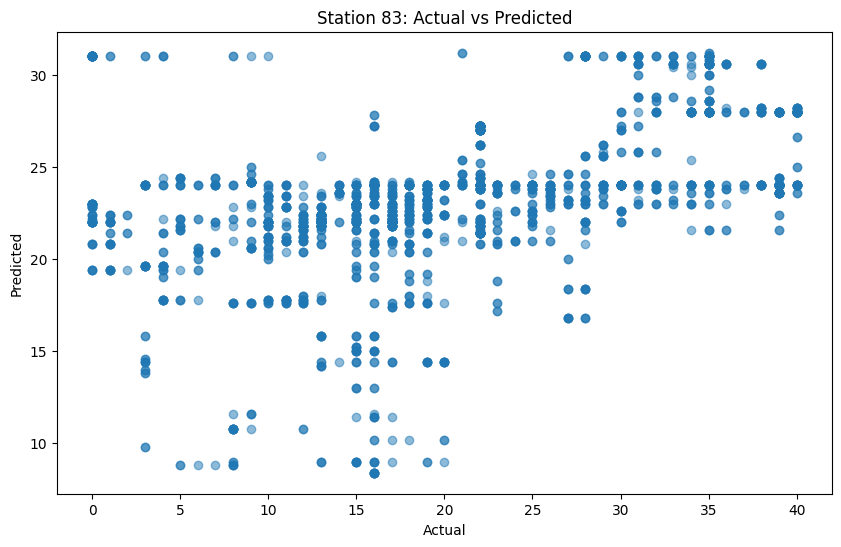

--------------------------------------------------
Number of predictions for station 104: 2202
Accuracy: 0.05131698455949137


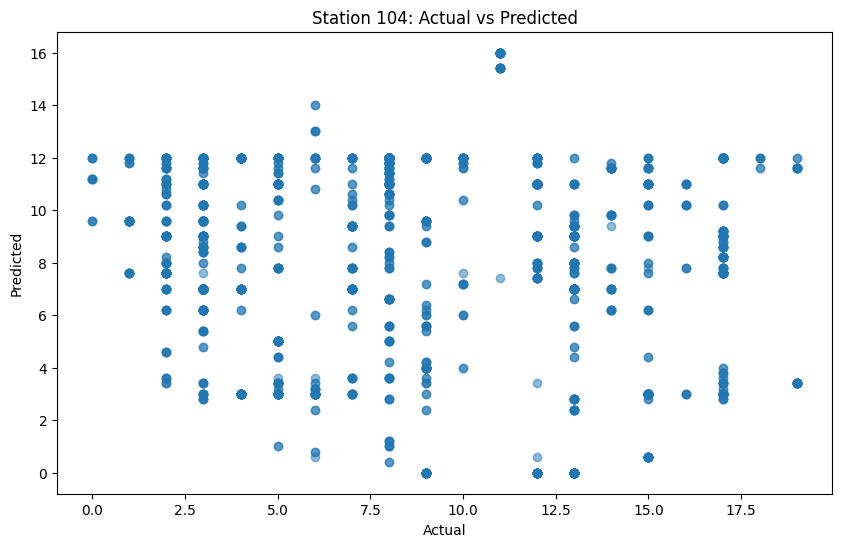

--------------------------------------------------
Number of predictions for station 42: 2202
Accuracy: 0.05631244323342416


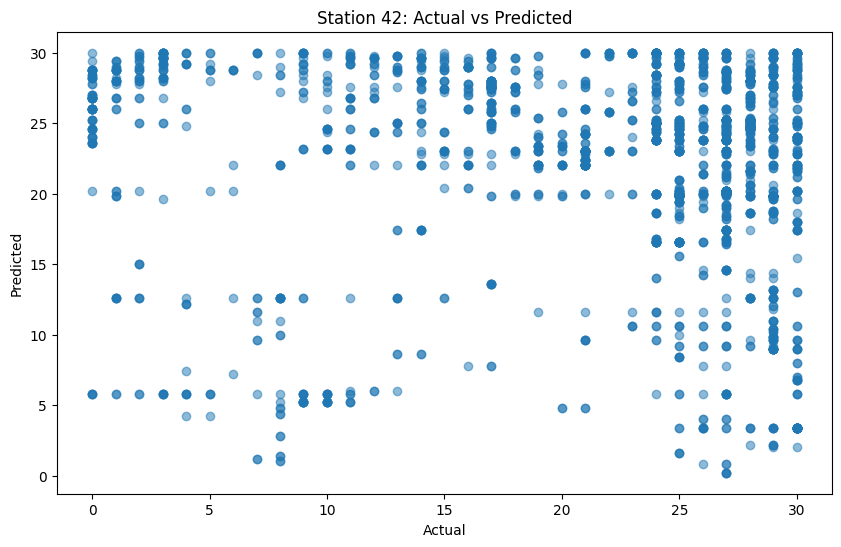

--------------------------------------------------
Number of predictions for station 69: 2202
Accuracy: 0.045413260672116255


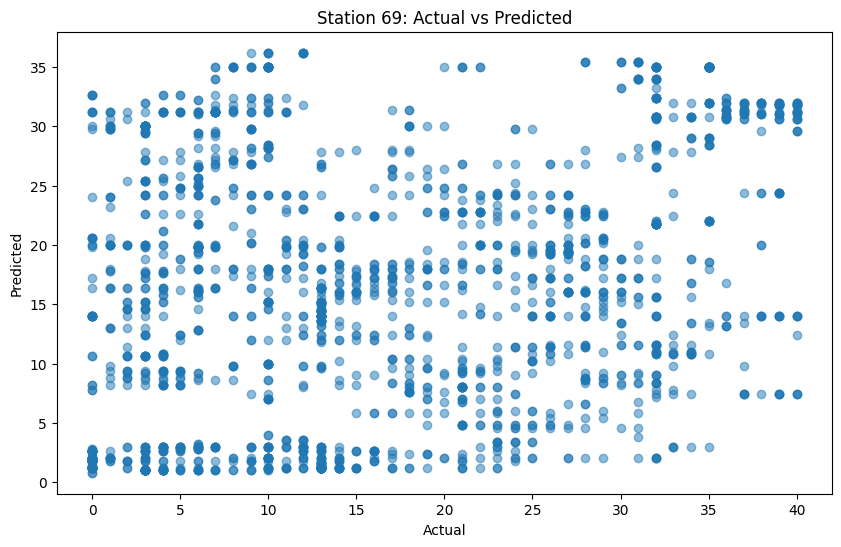

--------------------------------------------------
Number of predictions for station 77: 2202
Accuracy: 0.041326067211625794


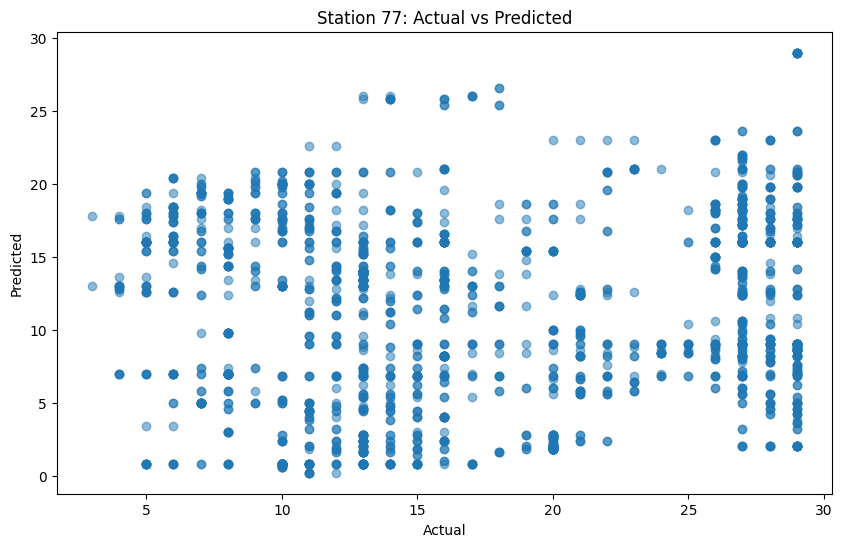

--------------------------------------------------
Number of predictions for station 8: 2202
Accuracy: 0.047229791099000905


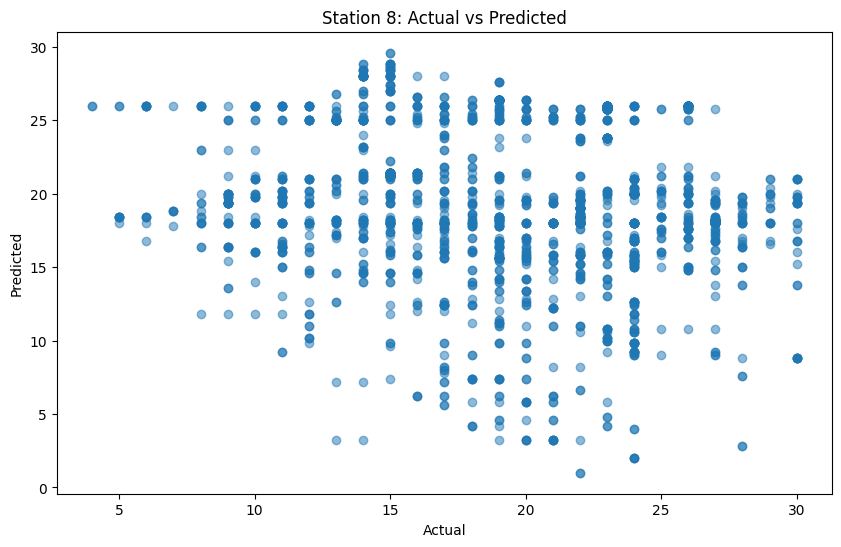

--------------------------------------------------
Number of predictions for station 40: 2202
Accuracy: 0.045413260672116255


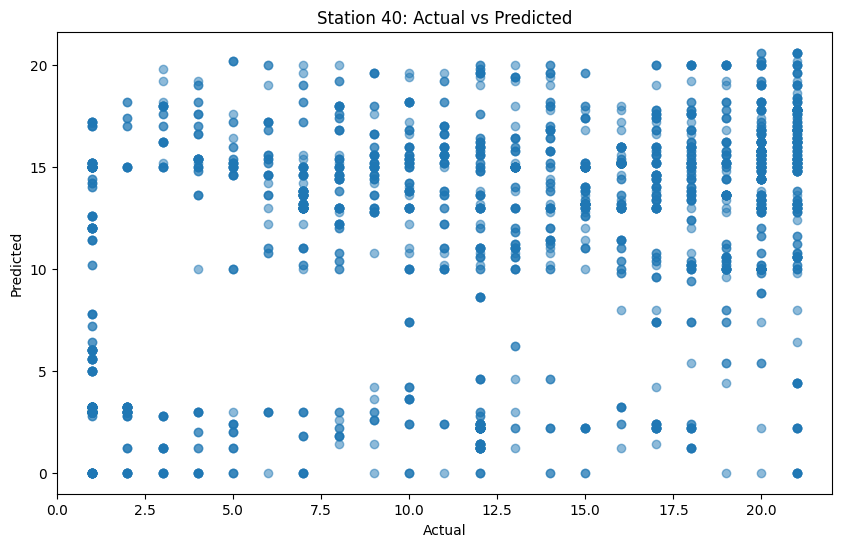

--------------------------------------------------
Number of predictions for station 28: 2202
Accuracy: 0.035422343324250684


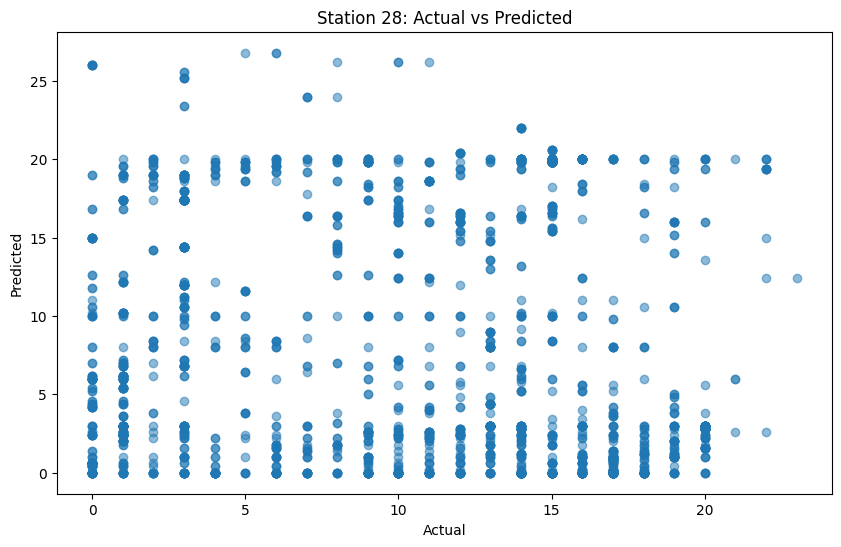

--------------------------------------------------
Number of predictions for station 115: 2202
Accuracy: 0.08219800181653043


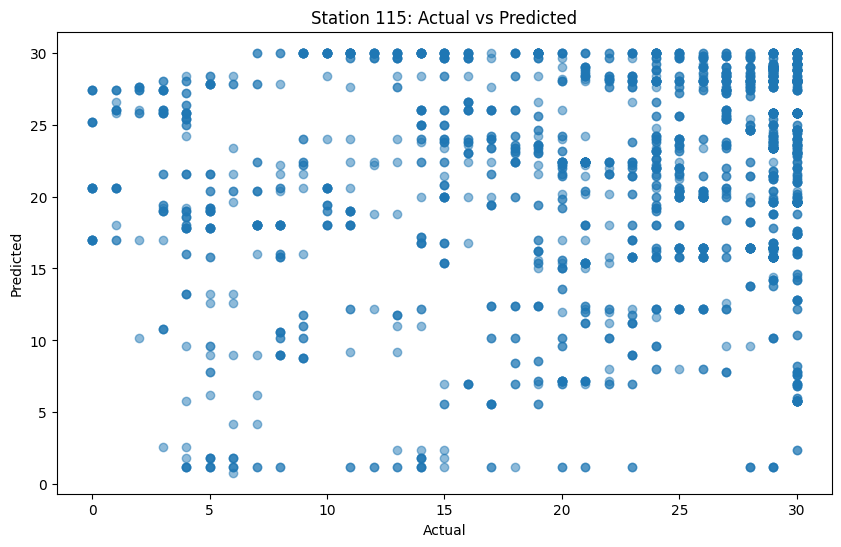

--------------------------------------------------
Number of predictions for station 12: 2202
Accuracy: 0.13124432334241598


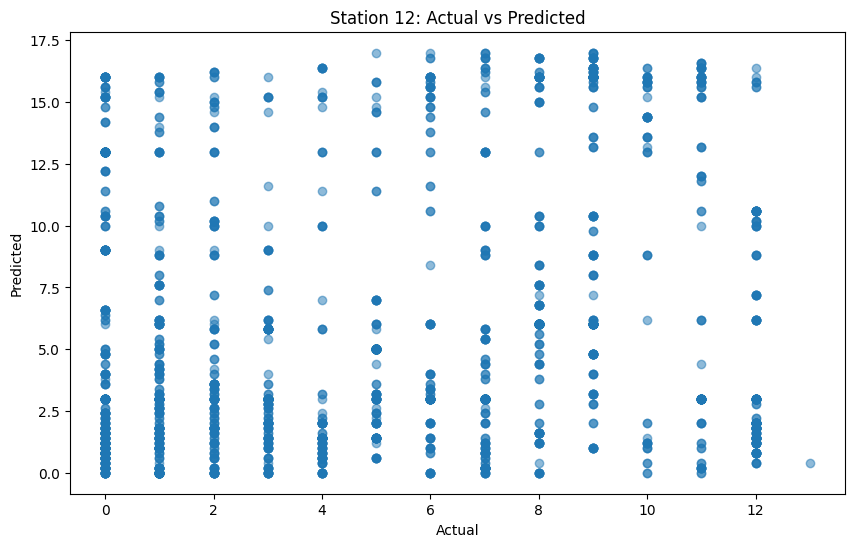

--------------------------------------------------
Number of predictions for station 27: 2202
Accuracy: 0.09355131698455948


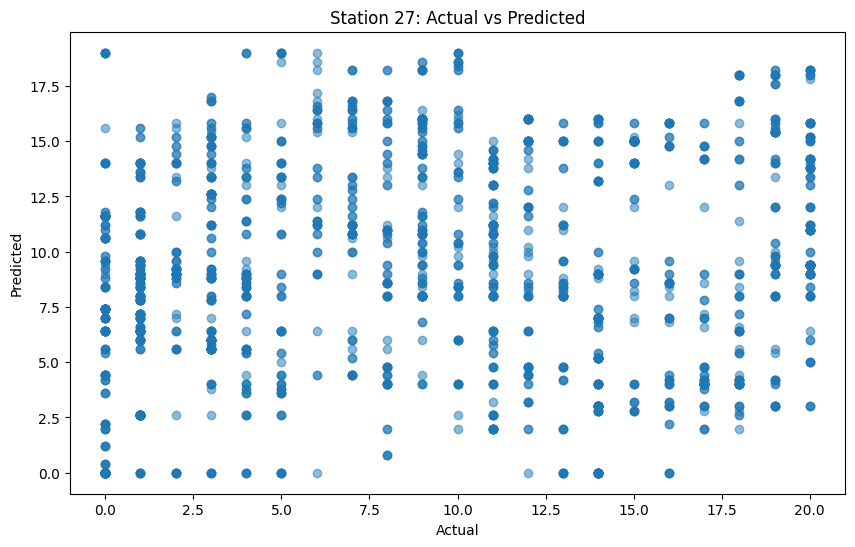

--------------------------------------------------
Number of predictions for station 100: 2202
Accuracy: 0.1298819255222525


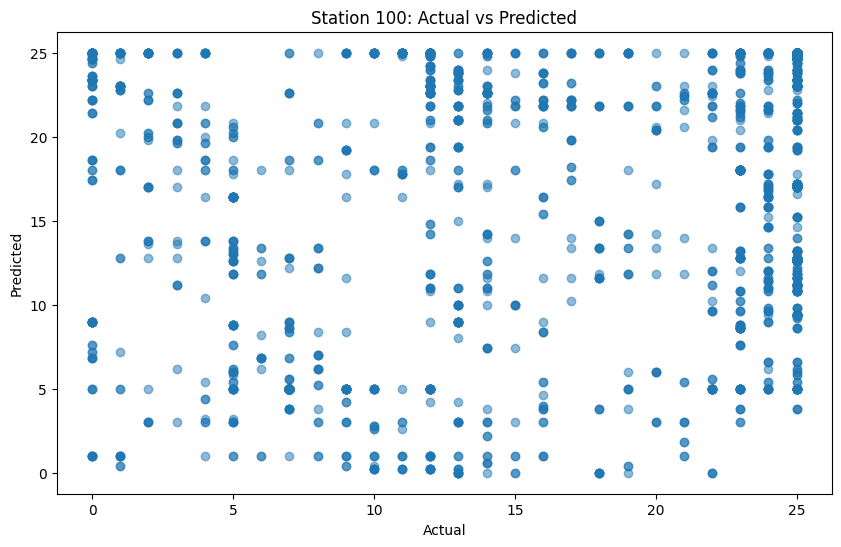

--------------------------------------------------
Number of predictions for station 31: 2202
Accuracy: 0.048138056312443236


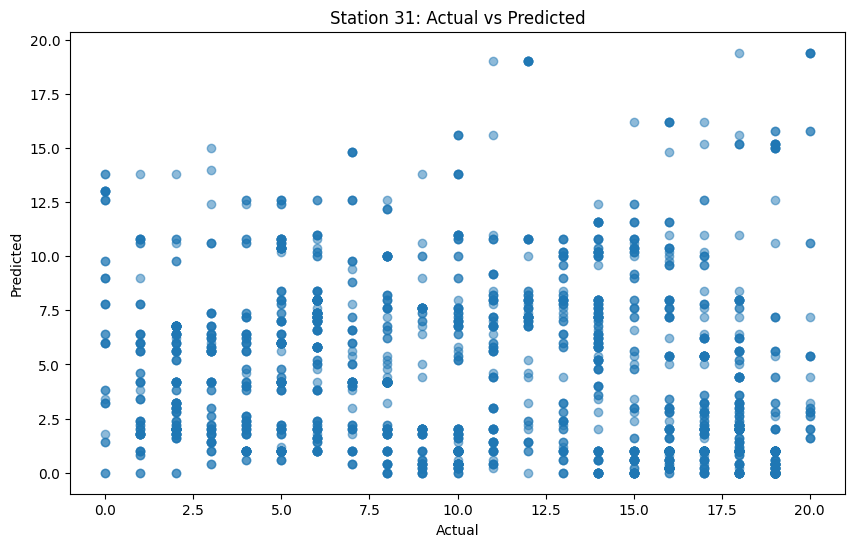

--------------------------------------------------
Number of predictions for station 22: 2202
Accuracy: 0.055858310626702996


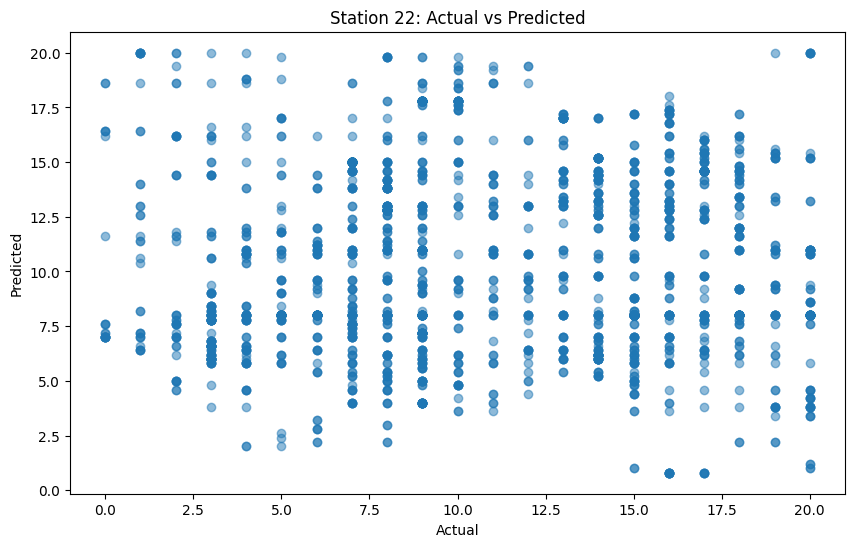

--------------------------------------------------
Number of predictions for station 23: 2202
Accuracy: 0.048138056312443236


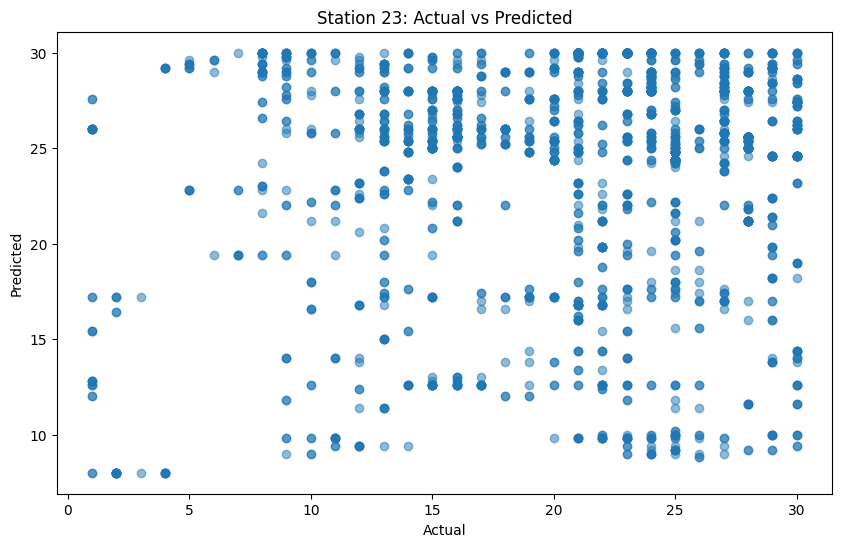

--------------------------------------------------
Number of predictions for station 26: 2202
Accuracy: 0.026793823796548592


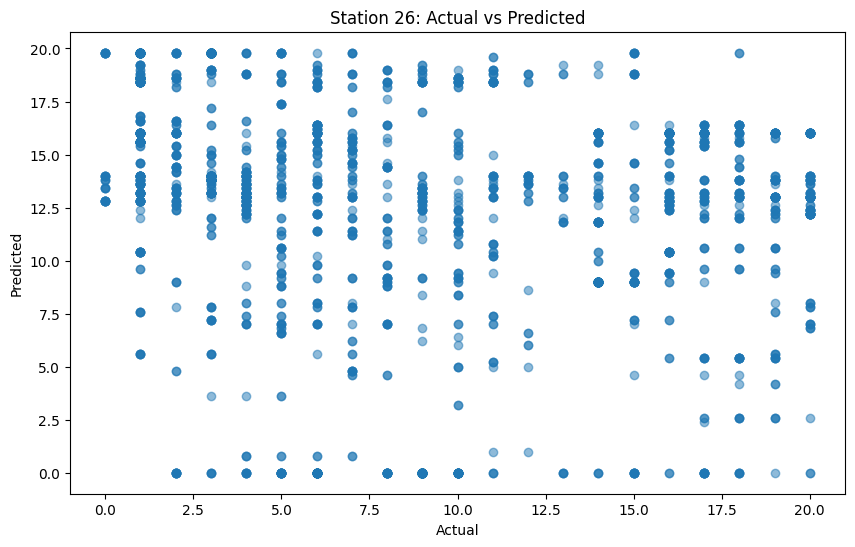

--------------------------------------------------
Number of predictions for station 39: 2202
Accuracy: 0.09309718437783833


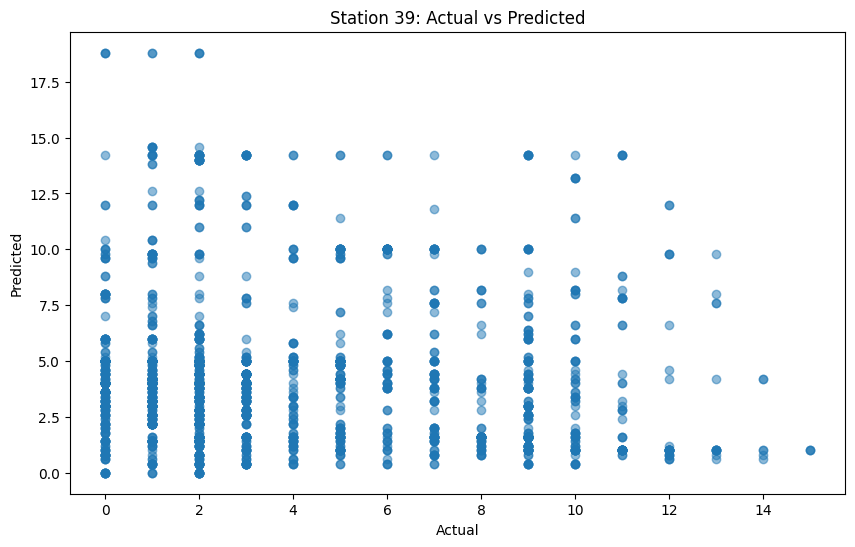

--------------------------------------------------
Number of predictions for station 30: 2202
Accuracy: 0.07674841053587647


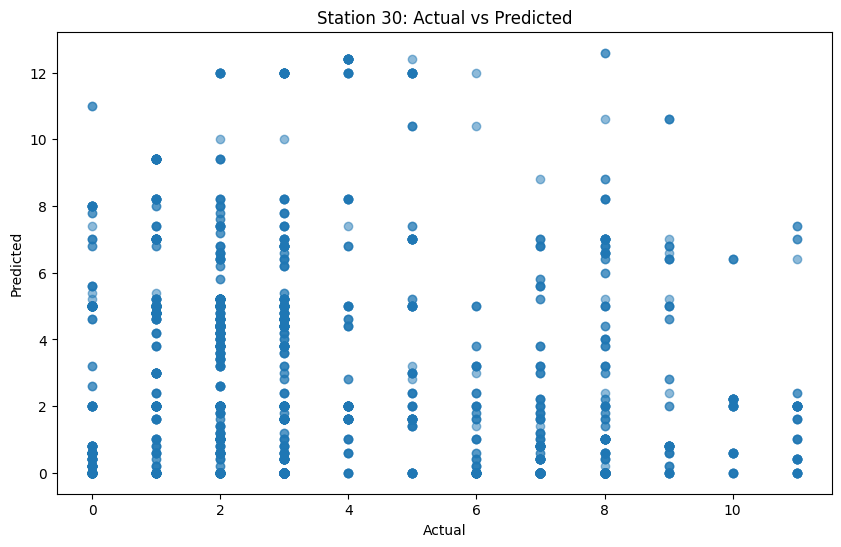

--------------------------------------------------
Number of predictions for station 38: 2202
Accuracy: 0.06130790190735695


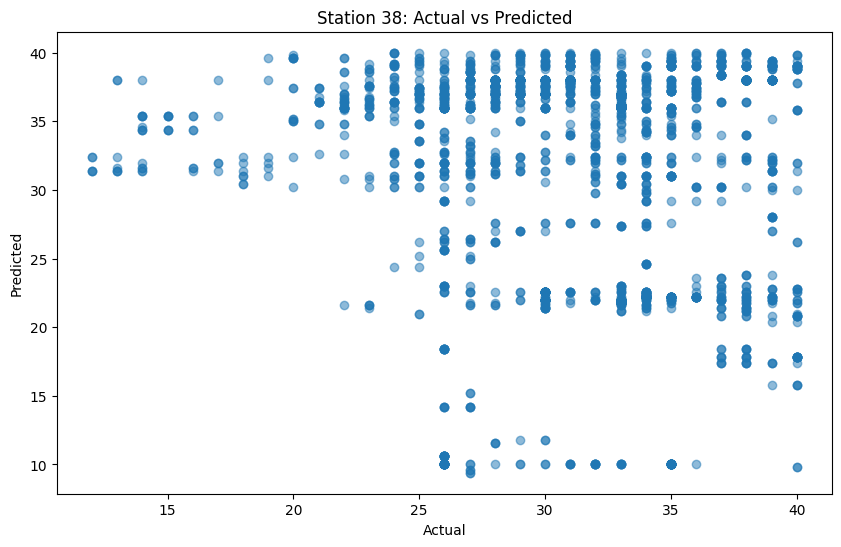

--------------------------------------------------
Number of predictions for station 48: 2202
Accuracy: 0.019981834695731154


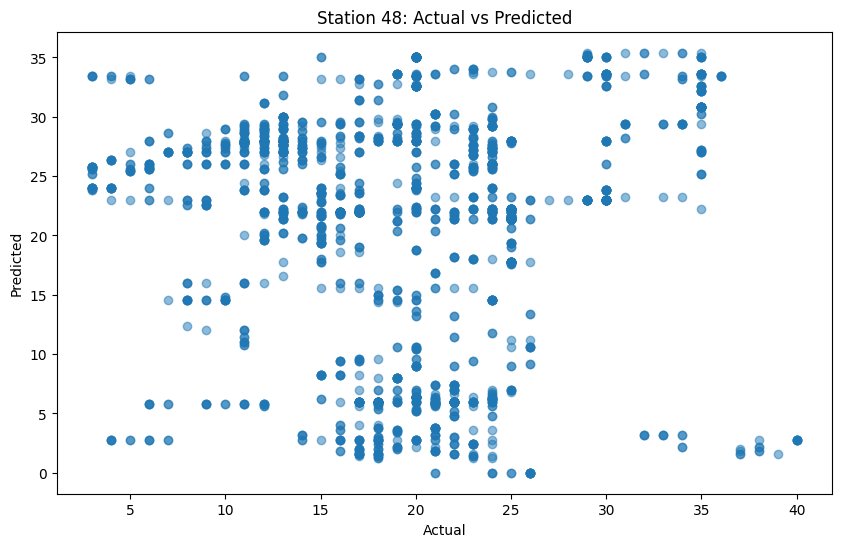

--------------------------------------------------
Number of predictions for station 66: 2202
Accuracy: 0.04041780199818347


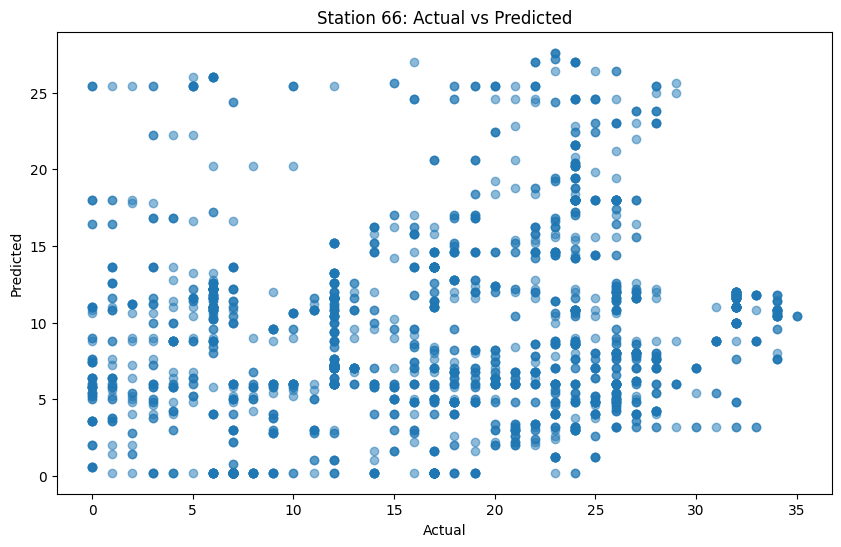

--------------------------------------------------
Number of predictions for station 102: 2202
Accuracy: 0.0885558583106267


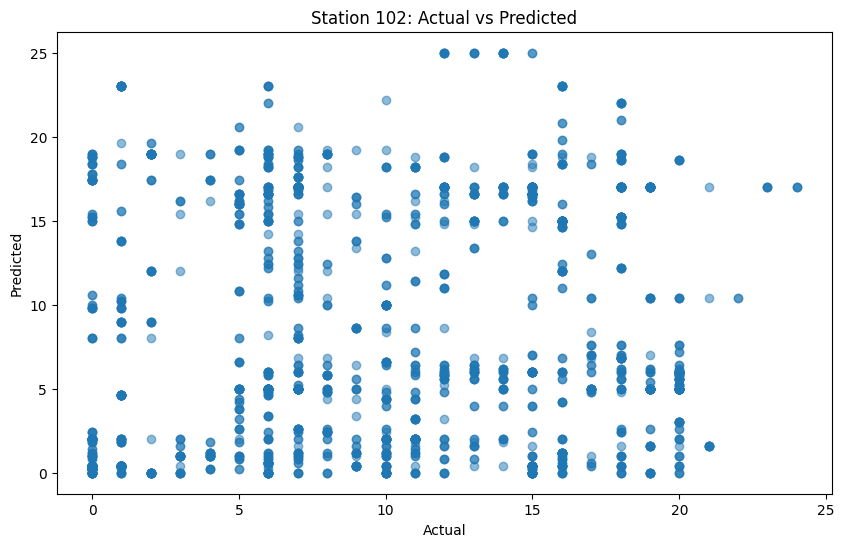

--------------------------------------------------
Number of predictions for station 3: 2202
Accuracy: 0.057674841053587646


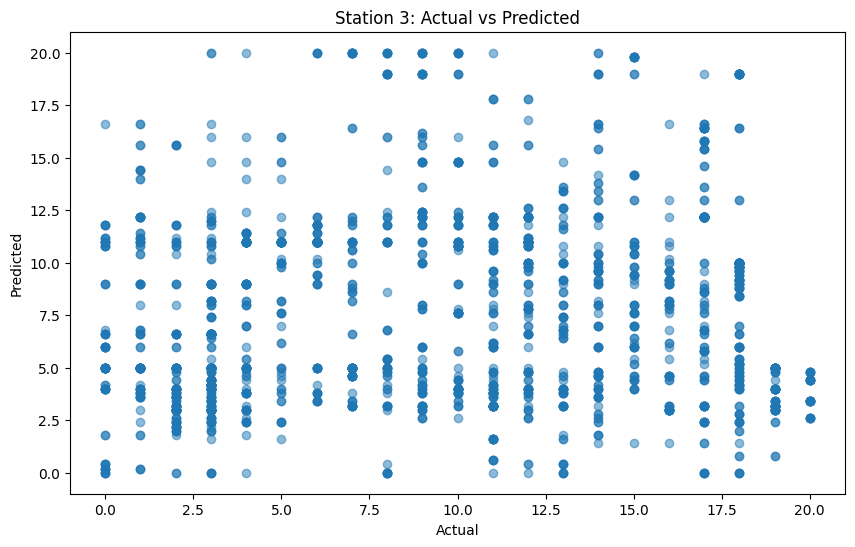

--------------------------------------------------
Number of predictions for station 14: 2202
Accuracy: 0.043596730245231606


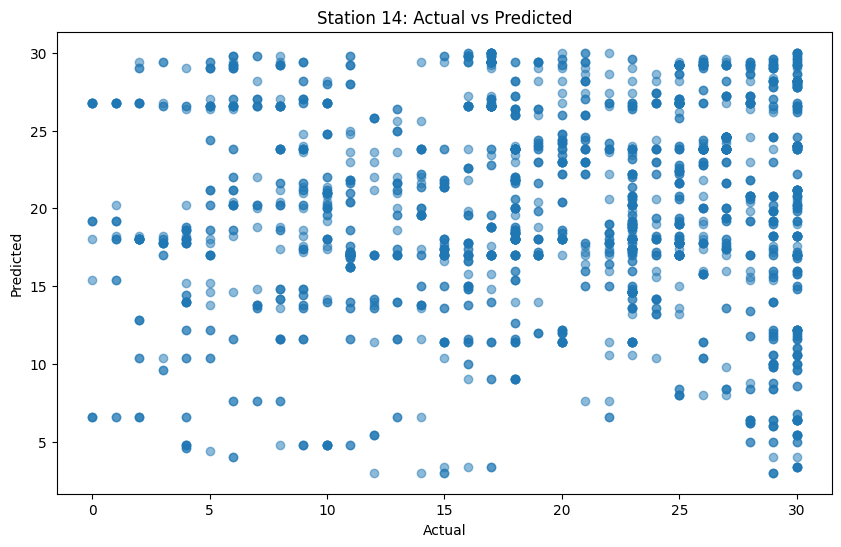

--------------------------------------------------


In [25]:
# from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
for station in stations:
    df_station = df_merged[df_merged["station_id"] == station]

    X = df_station.drop(
        ["available_bikes", "station_id"],
        axis=1,
    )
    y = df_station["available_bikes"]
    categorical_features = ['weather_id', 'hour', 'day_of_week']
    numerical_features = X.drop(columns=categorical_features).columns

    # Split the data into training and testing sets
    test_size = int(len(X) * 0.3)
    X_train = X[:-test_size]
    X_test = X[-test_size:]
    y_train = y[:-test_size]
    y_test = y[-test_size:]
    
    categorical_transformer = OneHotEncoder(handle_unknown='ignore')
    numerical_transformer = StandardScaler()

    preprocessor = ColumnTransformer(
        transformers=[
            ('num', numerical_transformer, numerical_features),
            ('cat', categorical_transformer, categorical_features)
        ])

    X_train = preprocessor.fit_transform(X_train)
    X_test = preprocessor.transform(X_test)

    # Train a KNN model
    model = KNeighborsRegressor()
    model.fit(X_train, y_train)

    # Store the model in the dictionary
    models[station] = model

    # Serialize model
    dump(model, f"ML_models/model{station}.joblib")

    # Make predictions on the testing data
    y_pred = model.predict(X_test)
    print(f"Number of predictions for station {station}: {len(y_pred)}")

    # Evaluate the model
    # RMSE + R^2
    y_pred_rounded = np.round(y_pred)

    accuracy = accuracy_score(y_test, y_pred_rounded)
    print(f"Accuracy: {accuracy}")

    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.5)
    plt.xlabel("Actual")
    plt.ylabel("Predicted")
    plt.title(f"Station {station}: Actual vs Predicted")
    plt.show()
    print("--------------------------------------------------")